

**DAYLIGHT SAVINGS????????**


In [130]:
#step 0 - install

!pip install "astropy>=3.1"
!pip install "sunpy[all]"
!pip install "sunkit-image[all]"

In [131]:
#step 1: load packages
import sunpy.map as smap
import sunpy.coordinates as spcoord
import numpy as np
import matplotlib.pyplot as plt
import sunkit_image
import scipy
import cv2
import astropy.units as u
import sunpy.map as smap
import sunpy.io._fits
import time
import os
import glob
import pandas as pd



from sunpy.coordinates import frames
from sunkit_image.coalignment import calculate_match_template_shift, apply_shifts
from skimage.measure import label, regionprops_table
from astropy.table import QTable
from astropy.time import Time
from sunpy.net import Fido
from sunpy.net import attrs as a
from sunkit_image.stara import stara
from astropy.io import fits
from sunkit_image.coalignment import mapsequence_coalign_by_match_template
from sunpy.coordinates.sun import angular_radius
from sunpy.coordinates.sun import earth_distance
from astropy.coordinates import EarthLocation
from sunpy.coordinates.sun import orientation
from sunpy.coordinates import Helioprojective
from skimage.measure import label, regionprops_table
from sunpy.net import Fido, attrs as a
from copy import deepcopy


print(sunpy.__version__)



7.1.0


In [132]:
#2: no python code necessary

#cleaned and renamed image files manually

#and debayered


In [133]:
#3: load in files

#file_date = ["/full/file/path/image1.fits", "/full/file/path/image2.fits", "/full/file/path/image3.fits"]

#needed help from AI to figure out the for loop sequence part, instead of copying and pasting 30 full path names

base = "/Users/elenasore/Documents/Assignments/ASTR 211/GIT_FINAL/astr211finalproject/GREEN"

files10_28 = [
    f"{base}/2025-10-28/2025-10-28 (GREEN)_{i}.fits"
    for i in range(1, 8)   # 1 → 7
]

print(files10_28)



files11_04 = [
    f"{base}/2025-11-04/2025-11-04 (GREEN)_{i:02d}.fits"
    for i in range(1, 31)
]


files11_06 = [
    f"{base}/2025-11-06/2025-11-06 (GREEN)_{i:02d}.fits"
    for i in range(1, 31)
]

files11_14_1 = [
    f"{base}/2025-11-14 - 1/2025-11-14 - 1 (GREEN)_{i:02d}.fits"
    for i in range(1, 31)
]

files11_14_2 = [
    f"{base}/2025-11-14 - 2/2025-11-14 - 2 (GREEN)_{i:02d}.fits"
    for i in range(1, 17)
]

files11_18 = [
    f"{base}/2025-11-18//2025-11-18 (GREEN)_{i:02d}.fits"
    for i in range(1, 38)
]


files11_19_1 = [
    f"{base}/2025-11-19 - 1/2025-11-19 - 1 (GREEN)_{i:03d}.fits"
    for i in range(1, 115)
]

files11_19_2 = [
    f"{base}/2025-11-19 - 2/2025-11-19 - 2 (GREEN)_{i:02d}.fits"
    for i in range(1, 20)
]

files11_20 = [
    f"{base}/2025-11-20/2025-11-20 (GREEN)_{i:02d}.fits"
    for i in range(1, 11)
]


all_files = [files10_28, files11_04, files11_06, files11_14_1, files11_14_2, files11_18, files11_19_1, files11_19_2, files11_20]

['/Users/elenasore/Documents/Assignments/ASTR 211/GIT_FINAL/astr211finalproject/GREEN/2025-10-28/2025-10-28 (GREEN)_1.fits', '/Users/elenasore/Documents/Assignments/ASTR 211/GIT_FINAL/astr211finalproject/GREEN/2025-10-28/2025-10-28 (GREEN)_2.fits', '/Users/elenasore/Documents/Assignments/ASTR 211/GIT_FINAL/astr211finalproject/GREEN/2025-10-28/2025-10-28 (GREEN)_3.fits', '/Users/elenasore/Documents/Assignments/ASTR 211/GIT_FINAL/astr211finalproject/GREEN/2025-10-28/2025-10-28 (GREEN)_4.fits', '/Users/elenasore/Documents/Assignments/ASTR 211/GIT_FINAL/astr211finalproject/GREEN/2025-10-28/2025-10-28 (GREEN)_5.fits', '/Users/elenasore/Documents/Assignments/ASTR 211/GIT_FINAL/astr211finalproject/GREEN/2025-10-28/2025-10-28 (GREEN)_6.fits', '/Users/elenasore/Documents/Assignments/ASTR 211/GIT_FINAL/astr211finalproject/GREEN/2025-10-28/2025-10-28 (GREEN)_7.fits']


In [134]:
#step 3.5: not all metadata has the correct telescope name and focal length, so update that to be consistent


for files in all_files:                    # loop over each observation set
    for i in range(len(files)):            # loop over each file in that set

        data, header = fits.getdata(files[i], header=True)

        header["INSTRUME"] = "SVBONY SV505C"
        header["XPIXSZ"]   = "5.800000"
        header["YPIXSZ"]   = "5.800000"
        header["TELESCOP"] = "William Optics 72mm Refractor Telescope (Outside)"
        header["FOCALLEN"] = "432.000000"
        header["APERTURE"] = "72.0"
        header["OBJECT"] = "Sun"
        header["RSUN_OBS"] = angular_radius(header["DATE-OBS"]).to_value(u.arcsec)
        header["DSUN_OBS"] = earth_distance(header["DATE-OBS"]).to_value(u.m)
        header["XBINNING"] = 2
        header["YBINNING"] = 2

        # write updated file
        fits.writeto(files[i], data, header, overwrite=True)


In [135]:
#now check again

example_frame = all_files[0][0]

print(fits.getdata(example_frame, header=True))

#looks good!

(array([[ 96,  96, 104, ..., 184, 120, 144],
       [ 88,  80,  96, ..., 160, 176, 144],
       [ 96, 120, 136, ..., 184, 120, 168],
       ...,
       [168, 120, 176, ..., 176, 128, 216],
       [184, 160, 104, ..., 152, 192, 176],
       [192, 168, 136, ..., 240, 208, 176]],
      shape=(769, 1356), dtype=uint16), SIMPLE  =                    T / conforms to FITS standard                      
BITPIX  =                   16 / array data type                                
NAXIS   =                    2 / number of array dimensions                     
NAXIS1  =                 1356                                                  
NAXIS2  =                  769                                                  
COMMENT  FITS (Flexible Image Transport System) format is defined in 'Astronomy 
COMMENT  and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H  
OBSERVER= 'Not Set '                                                            
SITELAT = 'Not Set '              

In [136]:
#4: fits to Map objects

#mkae earth location object
loc = EarthLocation.from_geodetic(lon="-73:12:06", lat="42:42:40", height=200)


#4a: compute the plate scale from one image
example_frame = all_files[0][0]

data0, header0 = fits.getdata(example_frame, header=True)

# Pixel size in microns → mm
px_microns = float(header0.get("XPIXSZ", 0))   # microns, 2.9
fl_mm      = float(header0.get("FOCALLEN", 0)) # mm, 432

px_mm = px_microns / 1000.0

plate_scale = (px_mm / fl_mm) * (180/np.pi) * 3600

print("Plate scale:", plate_scale, "arcsec/pixel")


#4B: add correct metadata to all images, and set coordinates to HPC

for files in all_files:              # loop over each observation set
    for i in range(len(files)):      # loop over each file in that set
      data, header = fits.getdata(files[i], header=True)
      header["CUNIT1"] = "arcsec"
      header["CUNIT2"] = "arcsec"
      header["CDELT1"] = plate_scale
      header["CDELT2"] = plate_scale
      header["CTYPE1"] = "HPLN-TAN"   # HPLN = Helioprojective longitude
      header["CTYPE2"] = "HPLT-TAN"   # HPLT = Helioprojective latitude
      fits.writeto(files[i], data, header, overwrite=True)


    #add in the info from the eclipse stuff here
    t_obs = Time(header["DATE-OBS"], format='isot') 
    earth_hgs = sunpy.coordinates.get_earth(t_obs)
    header["HGLN_OBS"] = earth_hgs.lon.to_value(u.deg)
    header["HGLT_OBS"] = earth_hgs.lat.to_value(u.deg)
    header["CRLN_OBS"] = earth_hgs.lon.to_value(u.deg)
    header["CRLT_OBS"] = earth_hgs.lat.to_value(u.deg)
    observer = loc.get_itrs(t_obs)
    solar_rotation_angle = sunpy.coordinates.sun.orientation(loc, t_obs)
    rotation_deg = solar_rotation_angle.to_value("deg")
    header["SOLARROT"] = (rotation_deg, "Solar rotation angle at obs location [deg]")
    frame = Helioprojective(observer=observer, obstime=t_obs)


# 4C: create map objects
all_map_seq = []

for file_list in all_files:            # file_list is one list of filenames
    maps = [smap.Map(f) for f in file_list]
    seq  = smap.MapSequence(maps)
    all_map_seq.append(seq)

#warning message: WARNING: SunpyMetadataWarning: Missing CTYPE1 from metadata, assuming CTYPE1 is HPLN-TAN [sunpy.map.mapbase] 2025-12-08 20:28:36 - sunpy - WARNING: SunpyMetadataWarning: Missing CTYPE1 from metadata, assuming CTYPE1 is HPLN-TAN
#WARNING: SunpyMetadataWarning: Missing CTYPE2 from metadata, assuming CTYPE2 is HPLT-TAN [sunpy.map.mapbase]2025-12-08 20:28:36 - sunpy - WARNING: SunpyMetadataWarning: Missing CTYPE2 from metadata, assuming CTYPE2 is HPLT-TAN

Plate scale: 2.7692960097989787 arcsec/pixel


In [137]:
#5: combine images

#used AI to do the sequence time print because I was worried about runtime

all_median_maps = []

for seq in all_map_seq:

    t0 = time.time()   # start timer

    aligned_seq = mapsequence_coalign_by_match_template(seq)

    data_list = []

    for m in aligned_seq:
        array = m.data
        data_list.append(array)

    data_cube = np.stack(data_list)
    median_data = np.median(data_cube, axis=0)
    median_map  = smap.Map(median_data, aligned_seq[-1].meta)


    all_median_maps.append(median_map)

    t1 = time.time()   # end timer

    idx = all_map_seq.index(seq)
    print(f"Sequence {idx+1}/{len(all_map_seq)} finished in {t1 - t0:.2f} seconds")

median_sequence = smap.MapSequence(all_median_maps)

Sequence 1/9 finished in 1.33 seconds
Sequence 2/9 finished in 5.49 seconds
Sequence 3/9 finished in 5.39 seconds
Sequence 4/9 finished in 5.52 seconds
Sequence 5/9 finished in 2.95 seconds
Sequence 6/9 finished in 6.59 seconds
Sequence 7/9 finished in 21.56 seconds
Sequence 8/9 finished in 3.63 seconds
Sequence 9/9 finished in 1.96 seconds


In [138]:
outdir = f"{base}/MEDIAN_FITS_CORRECT"
os.makedirs(outdir, exist_ok=True)

for i, m in enumerate(median_sequence, start=1):
    filename = os.path.join(outdir, f"median_{i}.fits")
    m.save(filename, overwrite=True)
    print(f"Saved: {filename}")

Saved: /Users/elenasore/Documents/Assignments/ASTR 211/GIT_FINAL/astr211finalproject/GREEN/MEDIAN_FITS_CORRECT/median_1.fits
Saved: /Users/elenasore/Documents/Assignments/ASTR 211/GIT_FINAL/astr211finalproject/GREEN/MEDIAN_FITS_CORRECT/median_2.fits
Saved: /Users/elenasore/Documents/Assignments/ASTR 211/GIT_FINAL/astr211finalproject/GREEN/MEDIAN_FITS_CORRECT/median_3.fits
Saved: /Users/elenasore/Documents/Assignments/ASTR 211/GIT_FINAL/astr211finalproject/GREEN/MEDIAN_FITS_CORRECT/median_4.fits
Saved: /Users/elenasore/Documents/Assignments/ASTR 211/GIT_FINAL/astr211finalproject/GREEN/MEDIAN_FITS_CORRECT/median_5.fits
Saved: /Users/elenasore/Documents/Assignments/ASTR 211/GIT_FINAL/astr211finalproject/GREEN/MEDIAN_FITS_CORRECT/median_6.fits
Saved: /Users/elenasore/Documents/Assignments/ASTR 211/GIT_FINAL/astr211finalproject/GREEN/MEDIAN_FITS_CORRECT/median_7.fits
Saved: /Users/elenasore/Documents/Assignments/ASTR 211/GIT_FINAL/astr211finalproject/GREEN/MEDIAN_FITS_CORRECT/median_8.fits


For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:06:30 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



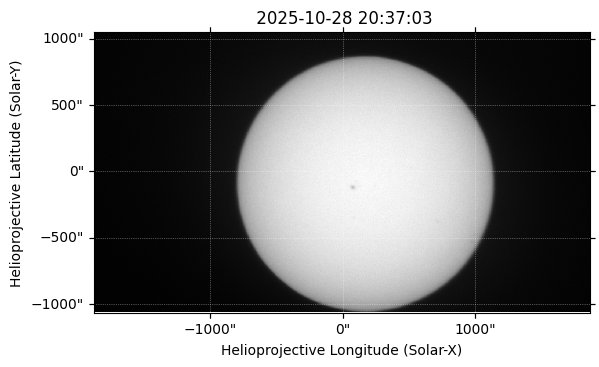

For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:06:30 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



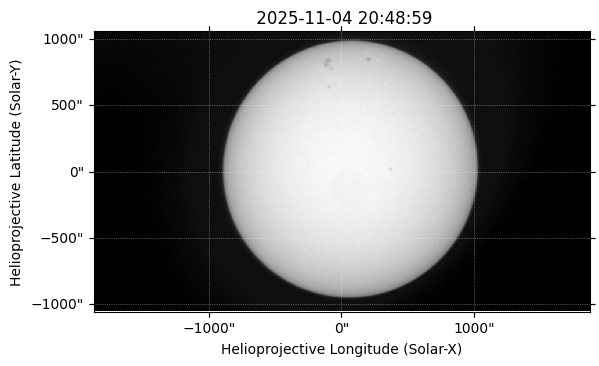

For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:06:30 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



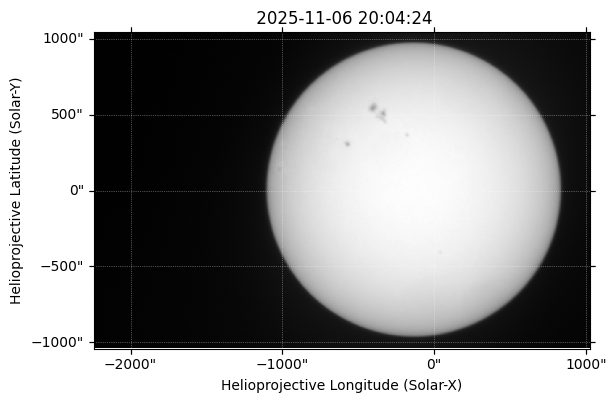

For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:06:30 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



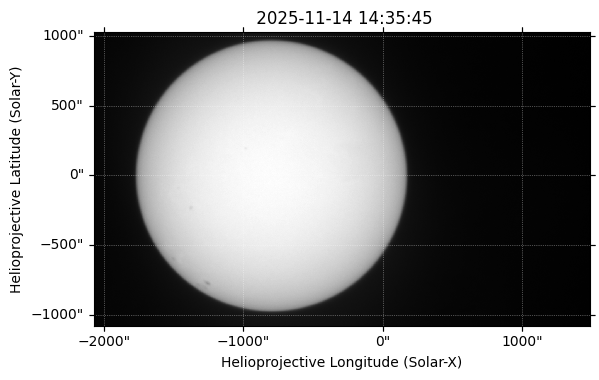

For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:06:30 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



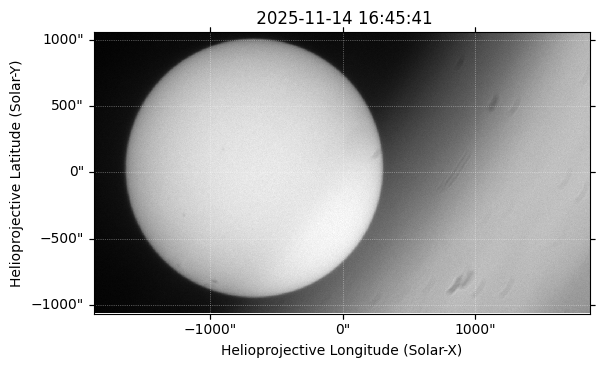

For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:06:30 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



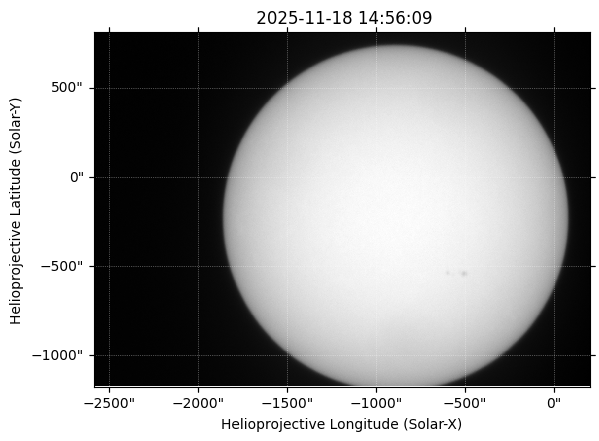

For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:06:30 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



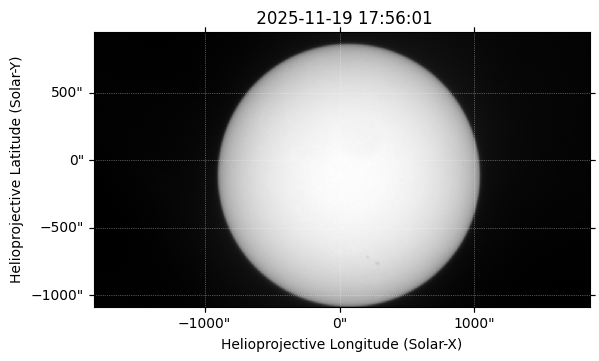

For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:06:30 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



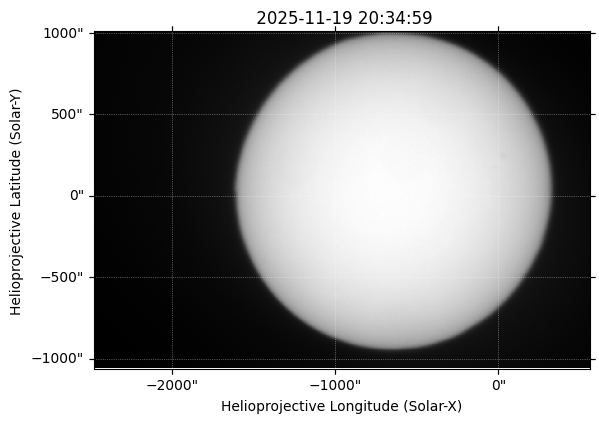

For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:06:30 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



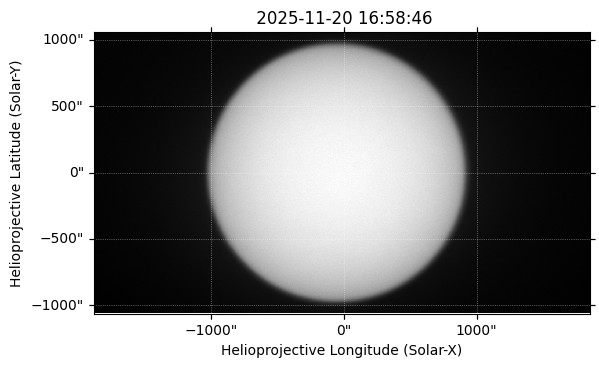

In [139]:
#actually plot them

for i in range(len(median_sequence)):   
    example_aligned = median_sequence[i]
    example_aligned.plot()
    plt.show()

In [140]:
#calculate sun center (using centroid with mask) for each median

#helper function created using AI

#approx radius and center approximated manually using ds9



# ------------------------------------------------------------
# 1) Helper: centroid inside a user-specified circular mask
# ------------------------------------------------------------
    #pull median array
    #pull iterated mask_center and mask_radii
    #create mask of 1 and 0
    #sum of (location*brightness*mask)/number of pixels
    
def weighted_circular_centroid_from_map(m, cx_fits, cy_fits, r_pix):
    """
    Compute brightness-weighted centroid inside a circular mask.

    Parameters
    ----------
    m : sunpy.map.Map
        Input SunPy map.
    cx_fits, cy_fits : float
        Approximate mask center in DS9/FITS 1-based pixel coordinates.
    r_pix : float
        Mask radius in pixels.

    Returns
    -------
    cx, cy : float
        Centroid in NumPy-style pixel coords (0-based).
    """
    
    data = np.nan_to_num(m.data, nan=0.0)
    ny, nx = data.shape

    # Convert FITS (1-based) → NumPy (0-based)
    cx0 = cx_fits - 1.0
    cy0 = cy_fits - 1.0

    # Pixel coordinate grid
    y, x = np.indices((ny, nx))

    # Circular mask: 1 inside, 0 outside
    r2 = (x - cx0)**2 + (y - cy0)**2
    mask = (r2 <= r_pix**2).astype(float)

    # Weighted brightness
    w = data * mask
    total = w.sum()

    # Safety fallback
    if total == 0:
        return cx0, cy0

    cx = (w * x).sum() / total
    cy = (w * y).sum() / total

    return cx, cy




# ------------------------------------------------------------
# 2) Per-image mask parameters (YOU fill these in)
#    All coordinates here are NumPy-style (0-based: 0..nx-1, 0..ny-1)
#    r_pix is the radius in pixels.
# ------------------------------------------------------------

# One (cx0, cy0) per median image (len = 9)
mask_centers = [
    # (cx0,    cy0)   # index 0
    (740,    349),    # TODO: replace with actual center for image 0
    (702,    386),    # image 1
    (763,    377),    # image 2
    (463,    386),    # image 3
    (438,    392),    # image 4
    (614,    339),    # image 5
    (684,    352),    # image 6
    (666,    392),    # image 7
    (662,    382),    # image 8
]





# One radius (in pixels) per median image (len = 9)
mask_radii = [
    350,   # TODO: radius for image 0
    352,   # image 1
    358,   # image 2
    358,   # image 3
    355,   # image 4
    355,   # image 5
    356,   # image 6
    357,   # image 7
    356,   # image 8
]

new_median_maps = []

for j, m in enumerate(median_sequence):   # j = 0..8
    data = m.data
    meta = m.meta.copy()

    # Get mask params for this image
    cx0, cy0 = mask_centers[j]          # 0-based
    r_pix    = mask_radii[j]            # pixels

    # Compute centroid restricted to this circular region
    sun_cx, sun_cy = weighted_circular_centroid_from_map(
        data,
        r_pix=r_pix,
        cx_fits=cx0,
        cy_fits=cy0)

    # Write reference pixel (CRPIX) using this centroid
    # NumPy is 0-based; FITS CRPIX is 1-based
    meta["CRPIX1"] = sun_cx + 1.0
    meta["CRPIX2"] = sun_cy + 1.0

    # Reference world coordinates (Sun center = 0,0 in HPC)
    meta["CRVAL1"] = 0.0
    meta["CRVAL2"] = 0.0

    # Keep everything else in meta the same
    new_median_maps.append(smap.Map(data, meta))

# Replace the old median sequence with the WCS-updated one
median_sequence = smap.MapSequence(new_median_maps)


In [141]:
median_sequence[0].meta

MetaDict([('simple': 'True')
('bitpix': '16')
('naxis': '2')
('naxis1': '1351')
('naxis2': '765')
('comment': 'FITS (Flexible Image Transport System) format is defined in 'Astronomy
 and Astrophysics', volume 376, page 359; bibcode: 2001A&A...376..359H')
('observer': 'Not Set')
('sitelat': 'Not Set')
('sitelong': 'Not Set')
('instrume': 'SVBONY SV505C')
('xpixsz': '5.800000')
('ypixsz': '5.800000')
('telescop': 'William Optics 72mm Refractor Telescope (Outside)')
('focallen': '432.000000')
('aperture': '72.0')
('object': 'Sun')
('objctra': 'Not Set')
('objctdec': 'Not Set')
('filter': 'Not Set')
('comment1': 'Not Set')
('colrccd': '1')
('ccd-temp': 'Not Supported')
('colortyp': 'GRBG')
('swcreate': 'AstroDMx Capture (2.14.1)')
('exptime': '0.119')
('exposure': '0.119')
('xbinning': '2')
('ybinning': '2')
('date-obs': '2025-10-28T20:37:03.355')
('localtim': '2025-10-28T16:37:03.355')
('ra': '0.0')
('dec': '0.0')
('gain': '1')
('wb-r': '41')
('wb-b': '41')
('wb-g': '25')
('blklevel': '0'

In [142]:
#print image dimensions - don't need to be exact but just similar enough

for i, m in enumerate(median_sequence):
    naxis1 = m.meta.get("NAXIS1")
    naxis2 = m.meta.get("NAXIS2")
    print(f"Image {i}: NAXIS1={naxis1}, NAXIS2={naxis2}")


# print solar center

for i, m in enumerate(median_sequence):
    meta = m.meta

    # FITS stores CRPIX as 1-based indices
    crpix1 = meta.get("CRPIX1", None)
    crpix2 = meta.get("CRPIX2", None)

    if crpix1 is None or crpix2 is None:
        print(f"Image {i}: CRPIX not set")
        continue

    # Convert to NumPy-style 0-based pixel coords
    cx = crpix1 - 1.0
    cy = crpix2 - 1.0

    print(f"Image {i}: solar center (NumPy coords) x={cx:.2f}, y={cy:.2f}")


print(mask_centers)



Image 0: NAXIS1=1351, NAXIS2=765
Image 1: NAXIS1=1351, NAXIS2=763
Image 2: NAXIS1=1180, NAXIS2=753
Image 3: NAXIS1=1284, NAXIS2=759
Image 4: NAXIS1=1351, NAXIS2=766
Image 5: NAXIS1=1006, NAXIS2=720
Image 6: NAXIS1=1327, NAXIS2=735
Image 7: NAXIS1=1099, NAXIS2=747
Image 8: NAXIS1=1351, NAXIS2=767
Image 0: solar center (NumPy coords) x=738.65, y=349.22
Image 1: solar center (NumPy coords) x=697.25, y=387.21
Image 2: solar center (NumPy coords) x=760.67, y=377.00
Image 3: solar center (NumPy coords) x=459.46, y=386.79
Image 4: solar center (NumPy coords) x=446.64, y=385.39
Image 5: solar center (NumPy coords) x=611.32, y=340.77
Image 6: solar center (NumPy coords) x=682.48, y=351.31
Image 7: solar center (NumPy coords) x=662.42, y=390.98
Image 8: solar center (NumPy coords) x=661.26, y=381.50
[(740, 349), (702, 386), (763, 377), (463, 386), (438, 392), (614, 339), (684, 352), (666, 392), (662, 382)]


For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:06:31 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



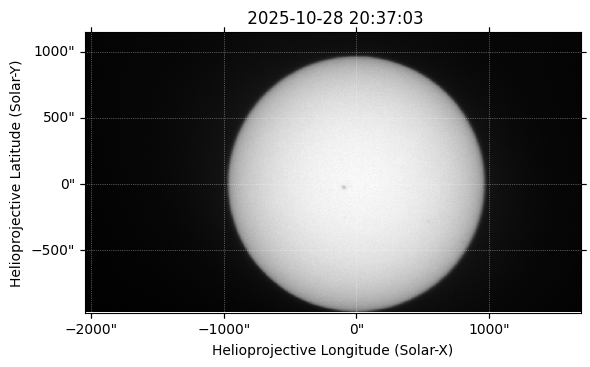

For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:06:31 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



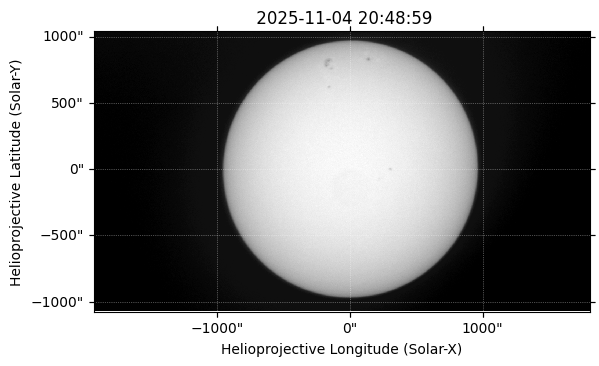

For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:06:31 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



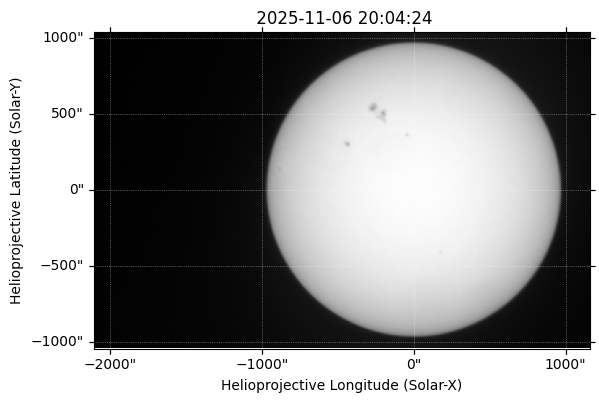

For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:06:31 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



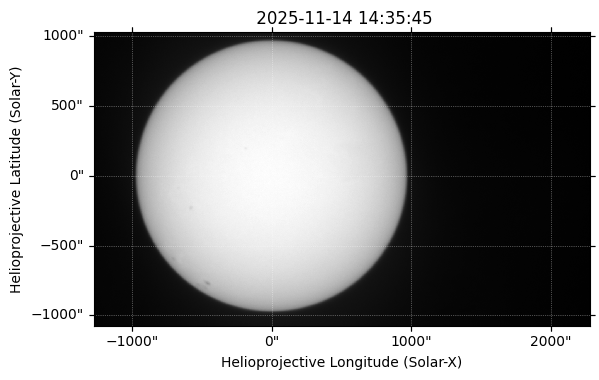

For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:06:31 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



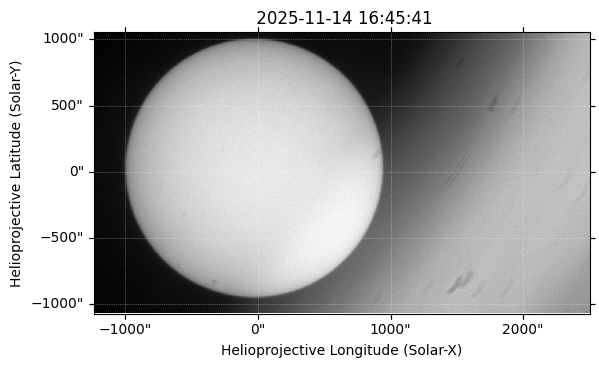

For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:06:31 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



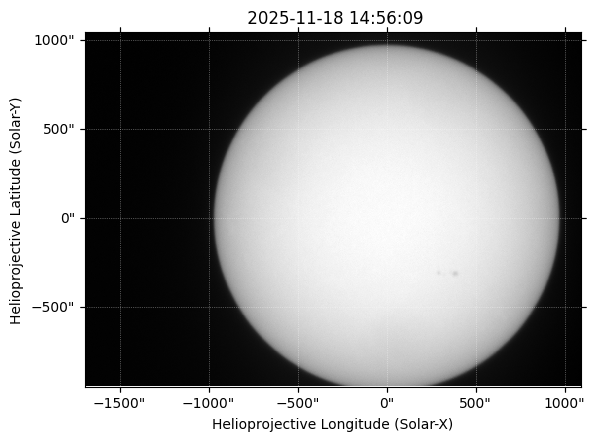

For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:06:31 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



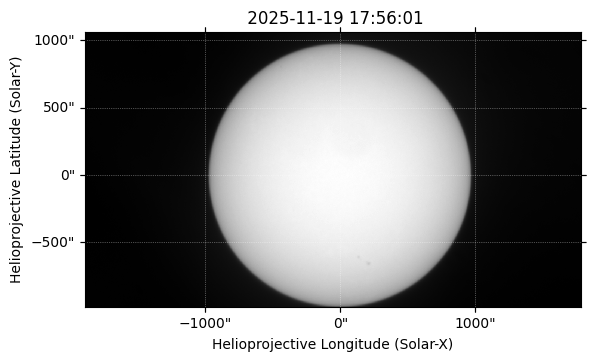

For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:06:31 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



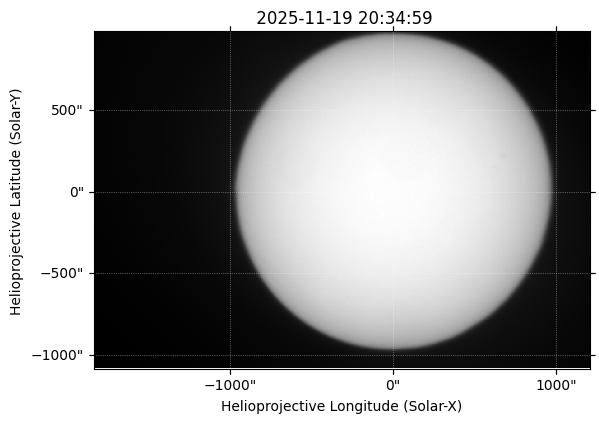

For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:06:31 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



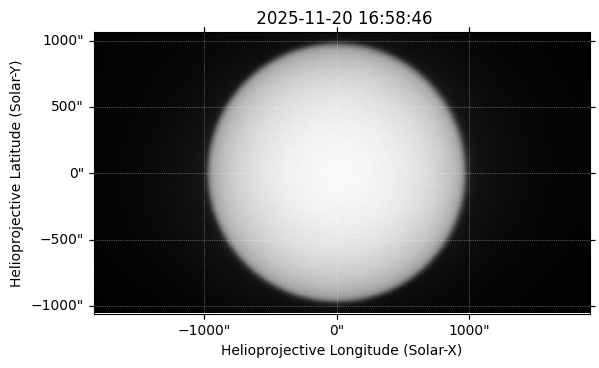

In [143]:
#actually plot them

for i in range(len(median_sequence)):   
    example_aligned = median_sequence[i]
    example_aligned.plot()
    plt.show()

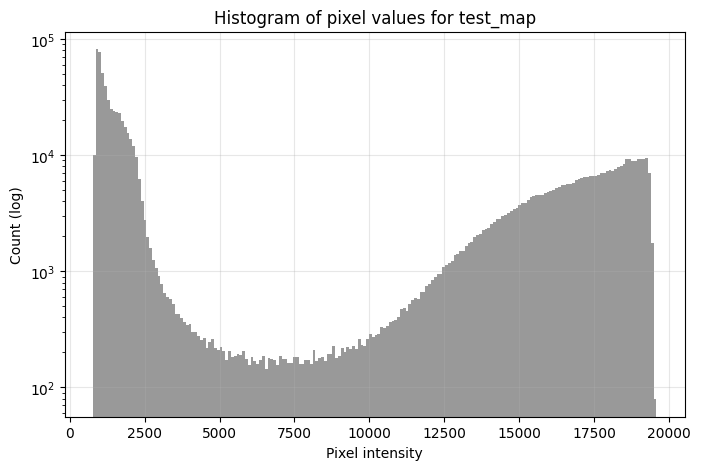

Min: 771.5
Max: 19576.0
Median: 2038.0
Percentiles (1, 50, 90, 95, 99): [  863.  2038. 18470. 18935. 19293.]


In [144]:
data = np.nan_to_num(median_sequence[2].data, nan=0.0)

plt.figure(figsize=(8,5))
plt.hist(data.flatten(), bins=200, color='gray', alpha=0.8)
plt.yscale('log')  # log scale is VERY useful for solar images
plt.xlabel("Pixel intensity")
plt.ylabel("Count (log)")
plt.title("Histogram of pixel values for test_map")
plt.grid(alpha=0.3)
plt.show()

print("Min:", np.nanmin(data))
print("Max:", np.nanmax(data))
print("Median:", np.nanmedian(data))
print("Percentiles (1, 50, 90, 95, 99):", np.nanpercentile(data, [1,50,90,95,99]))

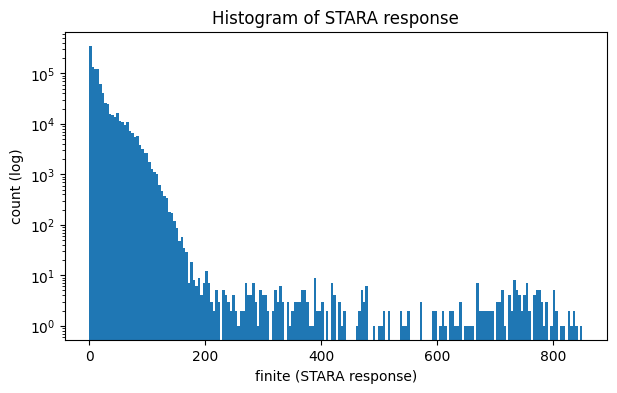

finite percentiles: p90 = 47.0, p95 = 66.0, p99 = 98.0


In [145]:
#threshold functions made using AI

import numpy as np
import astropy.units as u
from skimage.filters import median
from skimage.morphology import disk, white_tophat
from skimage.util import invert

def stara_response(m, circle_radius=100*u.arcsec, median_box=10*u.arcsec):
    """
    Do the STARA preprocessing and return the 'finite' image that gets
    thresholded. This is for inspecting the histogram and tuning threshold.
    """
    data = invert(m.data)

    # median filter
    m_pix = int((median_box / m.scale[0]).to_value(u.pix))
    if m_pix < 1:
        m_pix = 1
    med = median(data, footprint=np.ones((m_pix, m_pix)), behavior="ndimage")

    # structuring element for white-tophat
    c_pix = int((circle_radius / m.scale[0]).to_value(u.pix))
    circle = disk(c_pix // 2)

    finite = white_tophat(med, circle)
    finite[np.isnan(finite)] = 0

    return finite

test_map = median_sequence[0]
finite = stara_response(
    test_map,
    circle_radius = 20 * u.arcsec,      # ~your max spot size
    median_box    = 8 * u.arcsec
)

plt.figure(figsize=(7,4))
plt.hist(finite.ravel(), bins=200, log=True)
plt.xlabel("finite (STARA response)")
plt.ylabel("count (log)")
plt.title("Histogram of STARA response")
plt.show()

p90, p95, p99 = np.nanpercentile(finite, [90, 95, 99])
print(f"finite percentiles: p90 = {p90}, p95 = {p95}, p99 = {p99}")







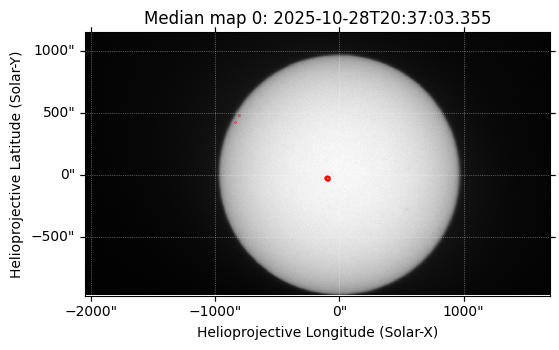

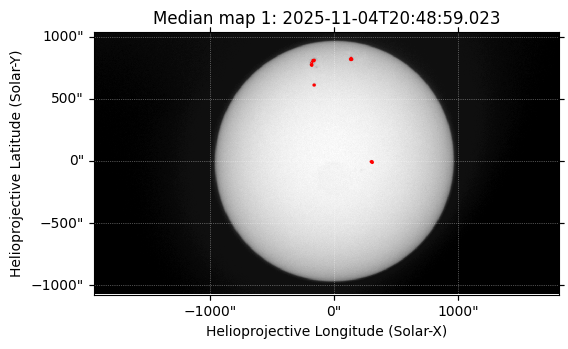

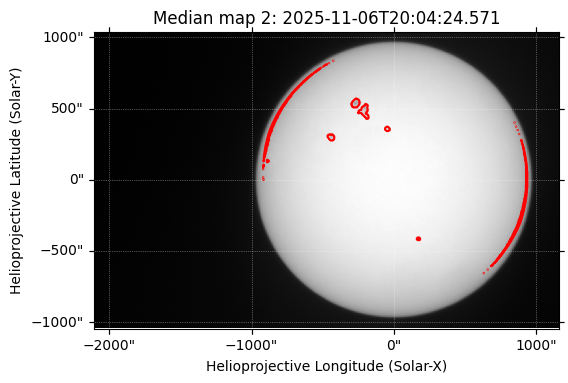

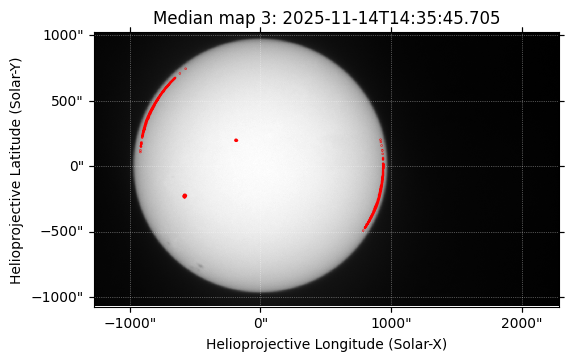

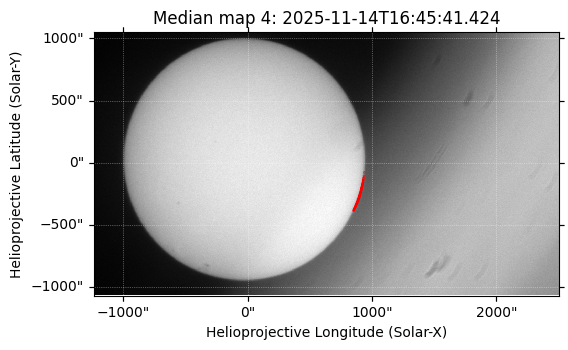

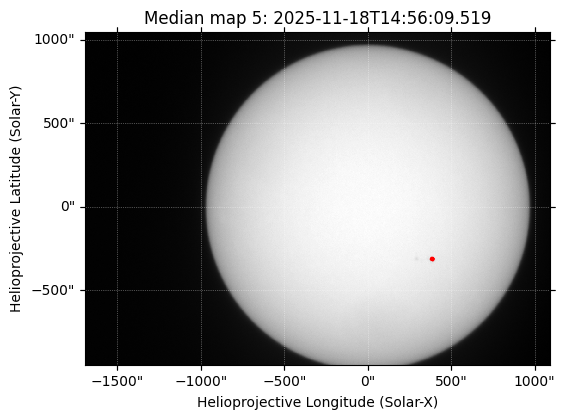

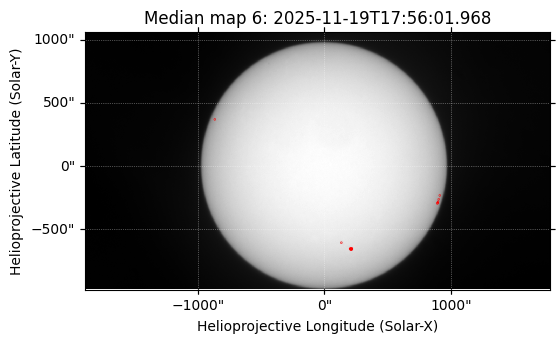

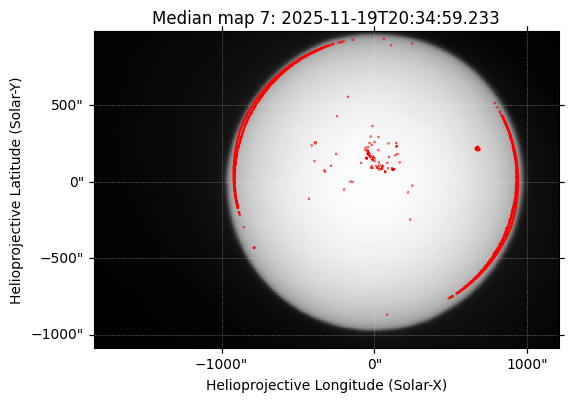

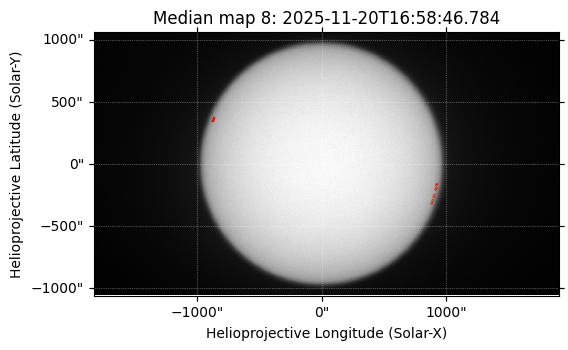

In [146]:

sunspot_masks = []      # boolean masks for each map
sunspot_pix   = []      # (xs, ys) pixel centroids per map
sunspot_hpc   = []      # SkyCoord centroids (helioprojective) per map

for i, m in enumerate(median_sequence):

    # 6A: Run STARA on this median map
    mask = stara(
        m,
        circle_radius = 60 * u.arcsec,   # max spot size
        median_box    = 5 * u.arcsec,    # local background scale
        threshold     = 500,              # from finite histogram
        limb_filter   = 3 * u.percent,  # ignore outer 10% of radius
    )
    sunspot_masks.append(mask)

    # 6B: label each connected sunspot region
    labels = label(mask)  # 0 = background, 1..N = regions

    props = regionprops_table(
        labels,
        properties=["label", "centroid"]
    )
    ys   = props["centroid-0"]   # rows (NumPy y)
    xs   = props["centroid-1"]   # cols (NumPy x)
    labs = props["label"]        # integer IDs

    sunspot_pix.append((xs, ys))

    # 6C: convert centroids to helioprojective coordinates (Solar-X, Solar-Y)
    coords = m.pixel_to_world(xs * u.pixel, ys * u.pixel)
    sunspot_hpc.append(coords)

    # 6D: quick diagnostic plot
    fig = plt.figure(figsize=(6, 6))
    ax  = plt.subplot(projection=m)

    m.plot(axes=ax)
    ax.contour(mask, levels=[0.5], colors="red", linewidths=1.5)



    ax.set_title(f"Median map {i}: {m.date.isot}")
    plt.show()
    plt.close()



#notes. threshold will depend on number of images in the median - (more images, less noise) - need to have different thresholds ofr each
#make a helper function that is stara and plot, then run it separately for each of the 9 medians 
#cross reference this with the visuals i see on ds9
#a mix of stara and manual work will help me identify sunspots
#also check with nasa info using framework of eclipse tutorial
#then convert coordinates
#then make table






**BELOW ARE THE STARA PLOTS TO USE**

In [147]:
# ----------------------------------------------------
# Helper: run STARA on one map and make a quick plot
# ----------------------------------------------------
def run_and_plot_stara(m, threshold_number, idx=None):
    """
    Run STARA on a single median map, label sunspots, convert to HPC coords,
    and make a diagnostic plot.

    Parameters
    ----------
    m : sunpy.map.Map
        The median map to analyze.
    threshold_number : float
        Threshold value to pass directly into STARA.
    idx : int or None
        Optional index for the plot title (e.g., median map number).

    Returns
    -------
    mask : 2D bool array
        STARA sunspot mask.
    xs, ys : 1D arrays
        Pixel centroids (NumPy x = cols, y = rows).
    coords : SkyCoord
        Helioprojective centroids for each sunspot.
    labs : 1D array
        Integer labels for each connected sunspot region.
    """

    # 6A: Run STARA
    mask = stara(
        m,
        circle_radius = 60 * u.arcsec,    # max spot size
        median_box    = 5 * u.arcsec,     # local background scale
        threshold     = threshold_number, # YOU choose this per median
        limb_filter   = 5 * u.percent,    # ignore outer 5% of radius
    )

    # 6B: label each connected sunspot region
    labels = label(mask)  # 0 = background, 1..N = regions

    props = regionprops_table(
        labels,
        properties=["label", "centroid"]
    )
    ys   = props["centroid-0"]   # rows (NumPy y)
    xs   = props["centroid-1"]   # cols (NumPy x)
    labs = props["label"]        # integer IDs

    # 6C: convert centroids to helioprojective coordinates (Solar-X, Solar-Y)
    coords = m.pixel_to_world(xs * u.pixel, ys * u.pixel)

    # 6D: quick diagnostic plot
    fig = plt.figure(figsize=(6, 6))
    ax  = plt.subplot(projection=m)

    m.plot(axes=ax)
    ax.contour(mask, levels=[0.5], colors="red", linewidths=1.5)

    
    plt.show()
    plt.close()

    return mask, xs, ys, coords, labs


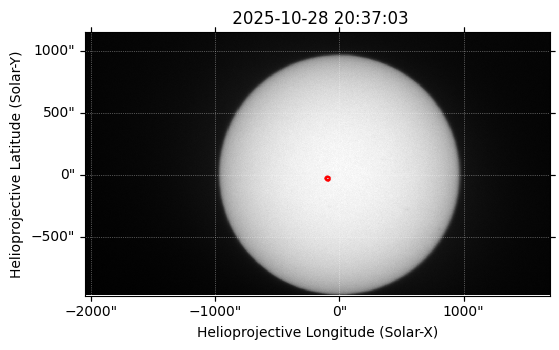

In [148]:
med_0_stara =run_and_plot_stara(median_sequence[0], 500)

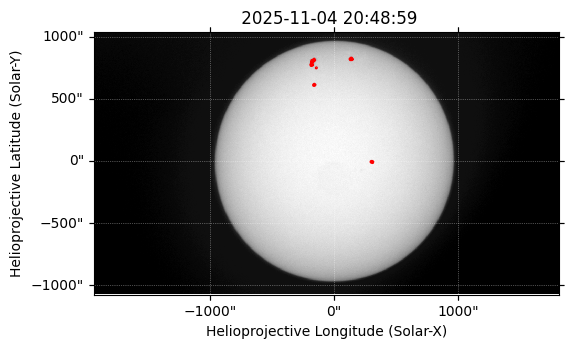

In [149]:
med_1_stara =run_and_plot_stara(median_sequence[1], 400)

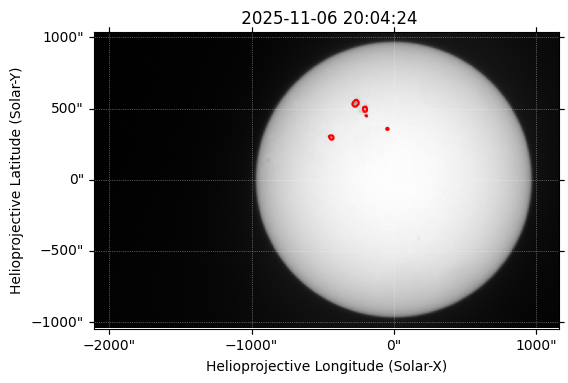

In [150]:
med_2_stara =run_and_plot_stara(median_sequence[2], 1500) #one left off at -900, 100?

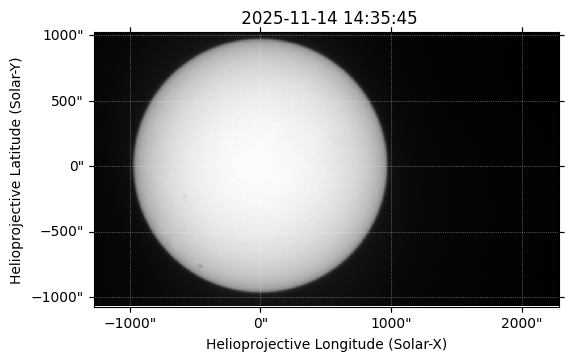

In [151]:
med_3_stara = run_and_plot_stara(median_sequence[3], 1000) #this one is all the way on the edge, need to add manual sunspots here

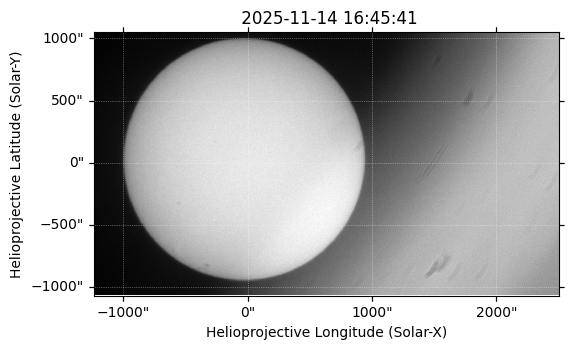

In [152]:
med_4_stara = run_and_plot_stara(median_sequence[4], 300) #this one is all the way on the edge (approx -300, -750), need to add manual sunspots here

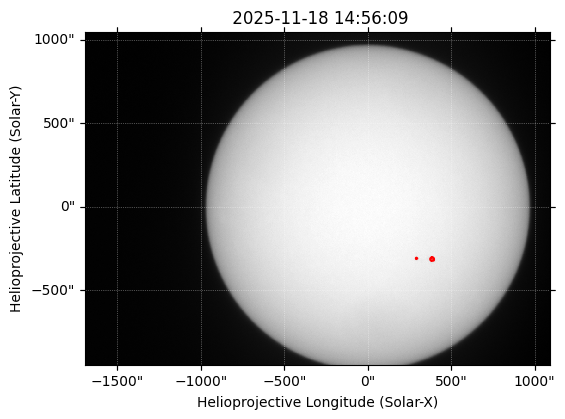

In [153]:
med_5_stara = run_and_plot_stara(median_sequence[5], 400) #this one is all the way on the edge, need to add manual sunspots here

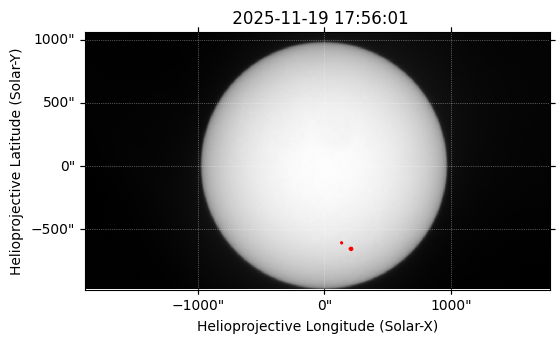

In [154]:
med_6_stara = run_and_plot_stara(median_sequence[6], 400)

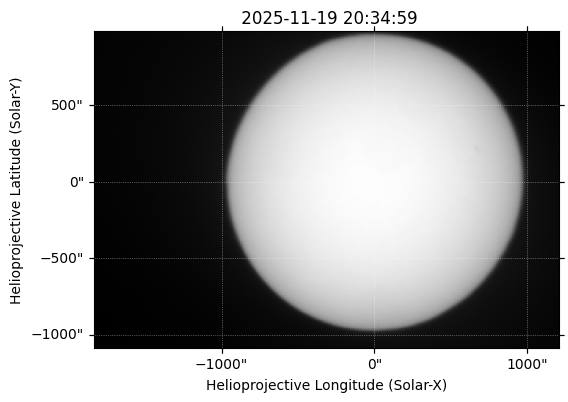

In [155]:
med_7_stara = run_and_plot_stara(median_sequence[7],1700)

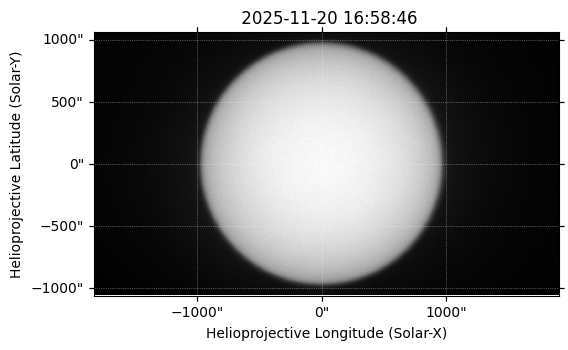

In [156]:
med_8_stara = run_and_plot_stara(median_sequence[8], 400)

In [157]:
stara_meds = [
    med_0_stara,
    med_1_stara,
    med_2_stara,
    med_3_stara,
    med_4_stara,
    med_5_stara,
    med_6_stara,
    med_7_stara,
    med_8_stara,
]


In [158]:
#nasa query helper function
#used AI

def fetch_closest_hmi(m, dt=5*u.min):
    t0 = m.date - dt
    t1 = m.date + dt

    result = Fido.search(
        a.Time(t0, t1),
        a.Instrument("HMI"),
        a.Physobs("intensity")
    )

  # --- important fix: check len(result) BEFORE result[0]
    if len(result) == 0 or len(result[0]) == 0:
        print(f"[WARN] No HMI continuum found around {m.date.isot}")
        return None

    # Get all candidate start times
    times = result[0]["Start Time"]  # array of Time objects

    # Compute absolute time difference from m.date (in seconds)
    diffs = np.abs((times - m.date).to(u.s).value)

    # Index of the closest file
    idx_closest = np.argmin(diffs)

    files = Fido.fetch(result[0, idx_closest])
    hmi_map = smap.Map(files[0])

    print(f"[OK] Matched HMI {hmi_map.date.isot} for median at {m.date.isot}")
    return hmi_map


In [159]:
#use helper function to get the closest time image to median sequence files
hmi_sequence = []

for i, m in enumerate(median_sequence):
    print(f"\n--- Median {i} ---")
    hmi_map = fetch_closest_hmi(m, dt=5*u.min)
    hmi_sequence.append(hmi_map)



--- Median 0 ---


Files Downloaded: 100%|██████████| 1/1 [00:01<00:00,  1.20s/file]


[OK] Matched HMI 2025-10-28T20:37:12.100 for median at 2025-10-28T20:37:03.355

--- Median 1 ---


Files Downloaded: 100%|██████████| 1/1 [00:01<00:00,  1.86s/file]


[OK] Matched HMI 2025-11-04T20:49:11.200 for median at 2025-11-04T20:48:59.023

--- Median 2 ---


Files Downloaded: 100%|██████████| 1/1 [00:01<00:00,  1.17s/file]


[OK] Matched HMI 2025-11-06T20:04:11.000 for median at 2025-11-06T20:04:24.571

--- Median 3 ---


Files Downloaded: 100%|██████████| 1/1 [00:04<00:00,  4.40s/file]


[OK] Matched HMI 2025-11-14T14:35:40.200 for median at 2025-11-14T14:35:45.705

--- Median 4 ---


Files Downloaded: 100%|██████████| 1/1 [00:01<00:00,  1.73s/file]


[OK] Matched HMI 2025-11-14T16:45:25.100 for median at 2025-11-14T16:45:41.424

--- Median 5 ---


Files Downloaded: 100%|██████████| 1/1 [00:01<00:00,  1.75s/file]


[OK] Matched HMI 2025-11-18T14:55:54.700 for median at 2025-11-18T14:56:09.519

--- Median 6 ---


Files Downloaded: 100%|██████████| 1/1 [00:02<00:00,  2.55s/file]


[OK] Matched HMI 2025-11-19T17:55:54.500 for median at 2025-11-19T17:56:01.968

--- Median 7 ---


Files Downloaded: 100%|██████████| 1/1 [00:01<00:00,  1.78s/file]


[OK] Matched HMI 2025-11-19T20:34:54.500 for median at 2025-11-19T20:34:59.233

--- Median 8 ---


Files Downloaded: 100%|██████████| 1/1 [00:01<00:00,  1.08s/file]

[OK] Matched HMI 2025-11-20T16:58:54.500 for median at 2025-11-20T16:58:46.784


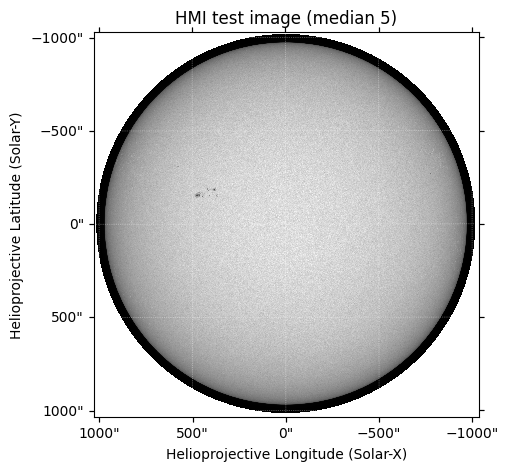

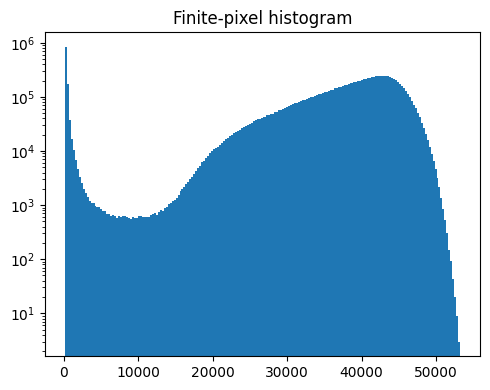

finite percentiles: p90 = 44999.0 p95 = 46121.0 p99 = 48002.0


In [160]:
#used AI to help make/debug this chunk


test_idx = 5
hmi_test = hmi_sequence[test_idx]

# ----------------- image plot (needs projection) -----------------
fig = plt.figure(figsize=(5, 5))
ax0 = plt.subplot(projection=hmi_test)   # <-- key change
hmi_test.plot(axes=ax0)
ax0.set_title(f"HMI test image (median {test_idx})")
plt.show()

# ----------------- histogram of finite pixels -----------------
fig, ax1 = plt.subplots(figsize=(5, 4))

data = hmi_test.data
finite_vals = data[np.isfinite(data)]

ax1.hist(finite_vals.ravel(), bins=200)
ax1.set_yscale("log")
ax1.set_title("Finite-pixel histogram")
plt.tight_layout()
plt.show()

# percentiles for picking a threshold
p90 = np.nanpercentile(finite_vals, 90)
p95 = np.nanpercentile(finite_vals, 95)
p99 = np.nanpercentile(finite_vals, 99)
print("finite percentiles: p90 =", p90, "p95 =", p95, "p99 =", p99)



try a threshold of 4700 then


Original HMI shape: (4096, 4096)
Resampled shape: (1024, 1024)
Resample took 0.07 s
Using threshold (small map): 6500
STARA on 1024x1024 took 0.59 s


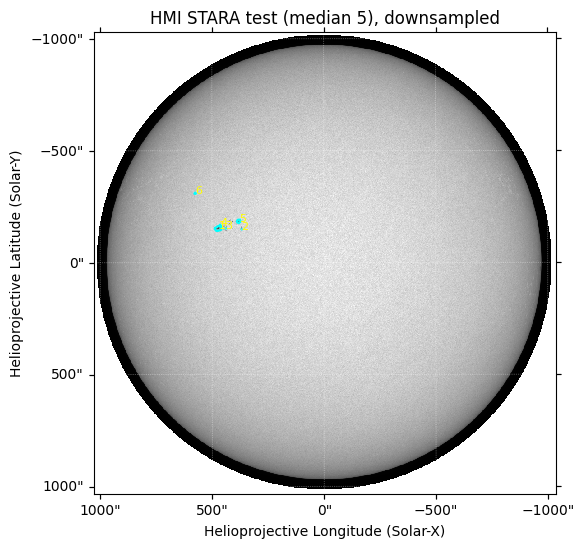

In [161]:
#make files smaller so it doesn't take 20 years to load

#4700 ended up being wayyy too sensistive
#and make median size bigger - 10 arcsec

test_idx  = 5
hmi_test  = hmi_sequence[test_idx]

print("Original HMI shape:", hmi_test.data.shape)

# Downsample to 1024x1024 for speed
t0 = time.time()
hmi_small = hmi_test.resample((1024, 1024) * u.pixel)
t1 = time.time()
print("Resampled shape:", hmi_small.data.shape)
print(f"Resample took {t1 - t0:.2f} s")

# Threshold from the *small* map
data_small = hmi_small.data
finite_vals_small = data_small[np.isfinite(data_small)]
p99_small = np.nanpercentile(finite_vals_small, 99)
threshold_hmi = 6500
print("Using threshold (small map):", threshold_hmi)

# Run STARA on the smaller image
t0 = time.time()
mask = stara(
    hmi_small,
    circle_radius = 30 * u.arcsec,   # smaller radius since we downsampled
    median_box    = 10 * u.arcsec,
    threshold     = threshold_hmi,
    limb_filter   = 3 * u.percent,
)
t1 = time.time()
print(f"STARA on 1024x1024 took {t1 - t0:.2f} s")

# Label + plot
labels = label(mask)
props  = regionprops_table(labels, properties=["label", "centroid"])
ys     = props["centroid-0"]
xs     = props["centroid-1"]
labs   = props["label"]

coords = hmi_small.pixel_to_world(xs * u.pixel, ys * u.pixel)

fig = plt.figure(figsize=(6, 6))
ax  = plt.subplot(projection=hmi_small)
hmi_small.plot(axes=ax)
ax.contour(mask, levels=[0.5], colors="cyan", linewidths=1.5)

for x, y, lab in zip(xs, ys, labs):
    ax.text(x, y, str(lab), color="yellow", fontsize=8)

ax.set_title(f"HMI STARA test (median {test_idx}), downsampled")
plt.show()
plt.close()


In [162]:
def run_stara_on_hmi_fast(hmi_map, threshold_number, out_shape=(1024, 1024)):
    """
    Downsample an HMI map, run STARA, and return mask + centroids in HPC.
    out_shape is (ny, nx) of the resampled map (in pixels).
    """
    # downsample for speed
    hmi_small = hmi_map.resample(out_shape * u.pixel)

    # STARA on the smaller map
    mask = stara(
        hmi_small,
        circle_radius = 60 * u.arcsec,   # still in arcsec (physical size)
        median_box    = 5 * u.arcsec,
        threshold     = 7000,
        limb_filter   = 1 * u.percent,
    )

    # label regions and get centroids in pixel coords
    labels = label(mask)
    props  = regionprops_table(labels, properties=["label", "centroid"])

    ys   = props["centroid-0"]   # rows
    xs   = props["centroid-1"]   # cols
    labs = props["label"]

    # convert to helioprojective (Solar-X, Solar-Y) coords
    coords = hmi_small.pixel_to_world(xs * u.pixel, ys * u.pixel)

    return hmi_small, mask, xs, ys, coords, labs



Running STARA on HMI for median 0...


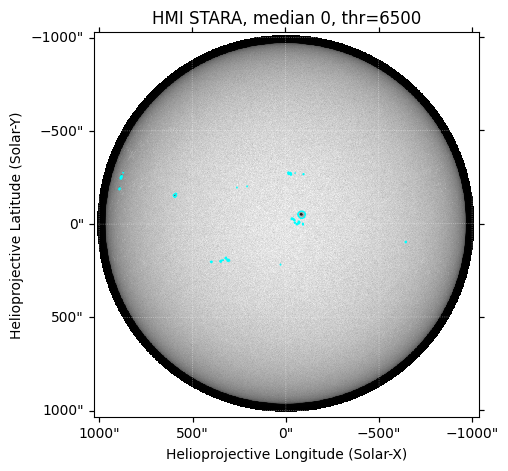


Running STARA on HMI for median 1...


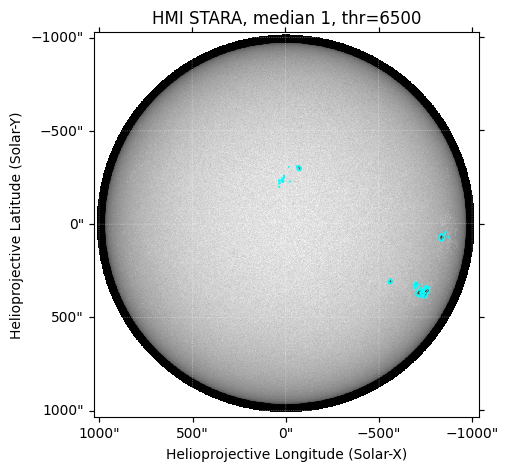


Running STARA on HMI for median 2...


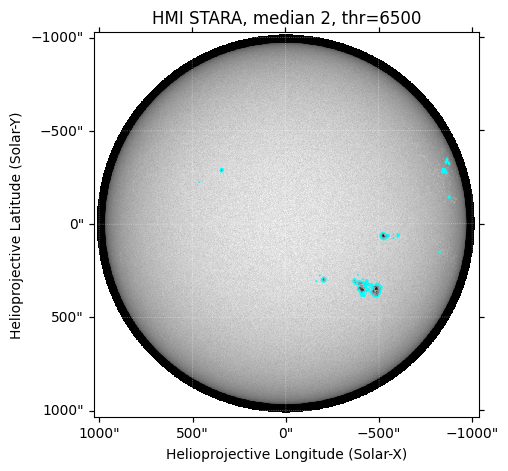


Running STARA on HMI for median 3...


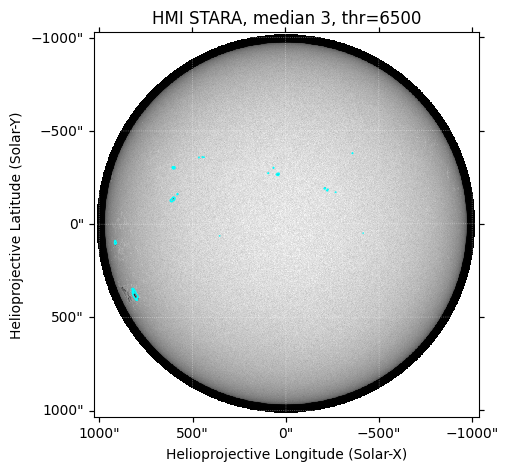


Running STARA on HMI for median 4...


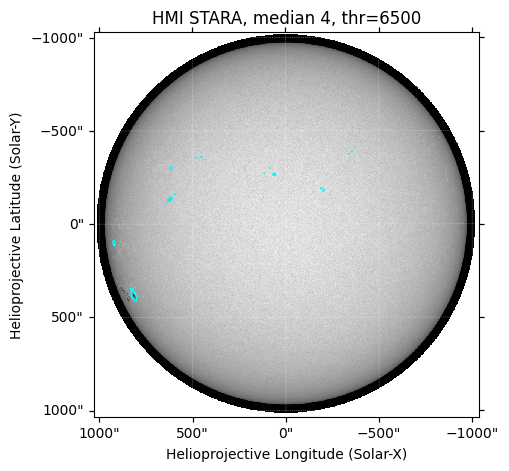


Running STARA on HMI for median 5...


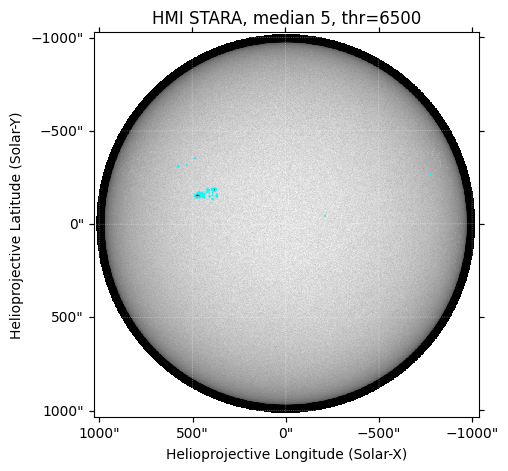


Running STARA on HMI for median 6...


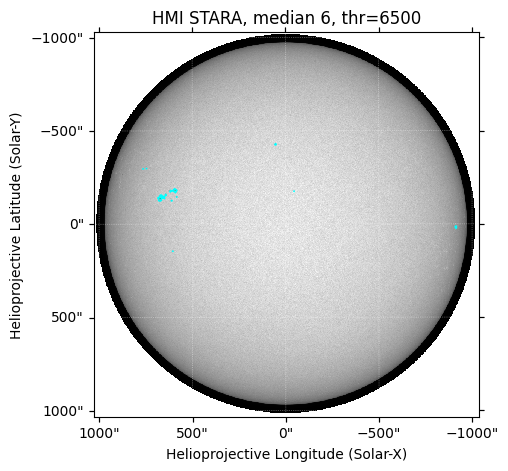


Running STARA on HMI for median 7...


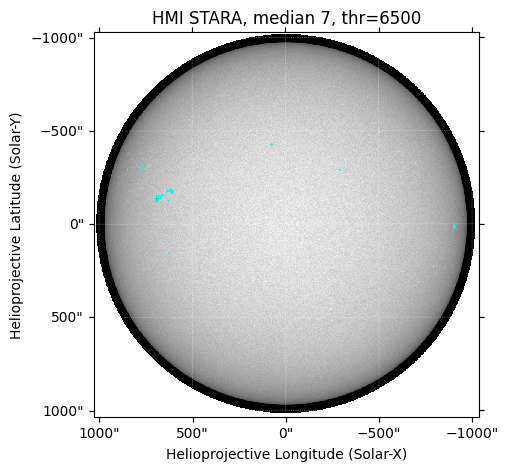


Running STARA on HMI for median 8...


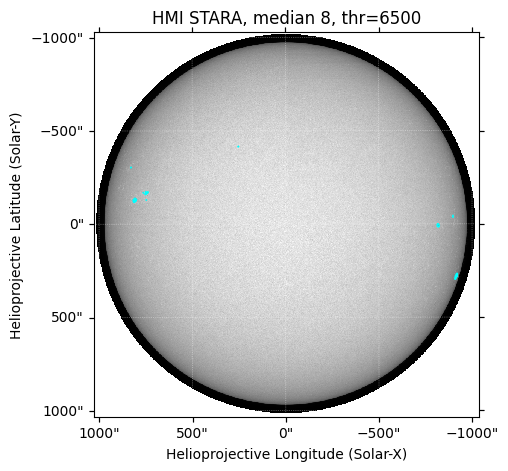

In [163]:
#used AI to debug and add in rotation angle stuff


# --- HMI STARA: downsample + run STARA (NO rotation) ---
hmi_small_maps = []   # downsampled HMI maps
hmi_masks      = []   # STARA masks (downsampled)
hmi_pix        = []   # (xs, ys) per HMI map (downsampled pixel coords)
hmi_hpc        = []   # SkyCoord centroids in HPC (for overlay)
hmi_labels     = []   # labels per spot

for i, hmi_map in enumerate(hmi_sequence):
    print(f"\nRunning STARA on HMI for median {i}...")
    if hmi_map is None:
        print("  -> No HMI map, skipping.")
        hmi_small_maps.append(None)
        hmi_masks.append(None)
        hmi_pix.append(None)
        hmi_hpc.append(None)
        hmi_labels.append(None)
        continue

    # run STARA directly on the HMI map (fast/downsampled)
    hmi_small, mask, xs, ys, coords, labs = run_stara_on_hmi_fast(
        hmi_map,
        threshold_number=threshold_hmi,
        out_shape=(1024, 1024),   # tweak if needed
    )

    hmi_small_maps.append(hmi_small)
    hmi_masks.append(mask)
    hmi_pix.append((xs, ys))
    hmi_hpc.append(coords)   # SkyCoord centroids in helioprojective coords
    hmi_labels.append(labs)

    # quick diagnostic plot (HMI-only)
    fig = plt.figure(figsize=(5, 5))
    ax  = plt.subplot(projection=hmi_small)
    hmi_small.plot(axes=ax)
    ax.contour(mask, levels=[0.5], colors="cyan", linewidths=1.0)
    ax.set_title(f"HMI STARA, median {i}, thr={threshold_hmi:.0f}")
    plt.show()
    plt.close()



In [164]:
def plot_stara_side_by_side(
    idx,
    median_sequence,
    stara_meds,
    hmi_maps,
    hmi_masks,
    hmi_pix=None,
    hmi_labels=None,
    # label styling / offsets
    med_label_color="yellow",
    hmi_label_color="orange",
    med_offset=(8, 8),     # (dx, dy) in pixels for our labels
    hmi_offset=(8, 8),     # (dx, dy) in pixels for HMI labels
    label_fontsize=11,
):
    """
    Show STARA result for one median image next to the corresponding
    STARA result on the NASA/HMI image, with numbered labels.

    Left:  our median map + red STARA contours + numbered labels.
    Right: HMI map       + cyan STARA contours + numbered labels.

    Also prints the number of sunspots detected in each panel.
    """

    # unpack our STARA results
    median_map = median_sequence[idx]
    median_mask, xs_med, ys_med, coords_med, labs_med = stara_meds[idx]

    hmi_map  = hmi_maps[idx]
    hmi_mask = hmi_masks[idx]

    if hmi_map is None or hmi_mask is None:
        print(f"Index {idx}: no HMI STARA result, skipping.")
        return

    # optional HMI centroids + labels
    xs_hmi, ys_hmi = (None, None)
    labs_hmi = None
    if hmi_pix is not None and hmi_labels is not None:
        xs_hmi, ys_hmi = hmi_pix[idx]
        labs_hmi = hmi_labels[idx]

    # counts
    n_med = len(labs_med)
    n_hmi = len(labs_hmi) if labs_hmi is not None else 0

    fig = plt.figure(figsize=(14, 6))

    # =============================================================
    # LEFT PANEL — OUR MEDIAN + RED STARA CONTOURS + LABELS
    # =============================================================
    ax1 = plt.subplot(1, 2, 1, projection=median_map)
    median_map.plot(axes=ax1)
    ax1.contour(
        median_mask,
        levels=[0.5],
        colors="red",
        linewidths=1.4,
    )

    dx_med, dy_med = med_offset

    # label our sunspots slightly offset from the centroids
    for label, x, y in zip(labs_med, xs_med, ys_med):
        ax1.text(
            x + dx_med,
            y + dy_med,
            str(label),
            color=med_label_color,
            fontsize=label_fontsize,
            fontweight="bold",
            ha="center",
            va="center",
        )

    t_med = getattr(median_map, "date", None)
    title_med = t_med.isot if t_med is not None else f"Median {idx}"
    ax1.set_title(f"Our Data (Median {idx}, N={n_med})\n{title_med}")

    # =============================================================
    # RIGHT PANEL — HMI + CYAN STARA CONTOURS + LABELS
    # =============================================================
    ax2 = plt.subplot(1, 2, 2, projection=hmi_map)
    hmi_map.plot(axes=ax2)
    ax2.contour(
        hmi_mask,
        levels=[0.5],
        colors="cyan",
        linewidths=1.4,
    )

    dx_hmi, dy_hmi = hmi_offset

    if xs_hmi is not None and labs_hmi is not None:
        for label, x, y in zip(labs_hmi, xs_hmi, ys_hmi):
            ax2.text(
                x + dx_hmi,
                y + dy_hmi,
                str(label),
                color=hmi_label_color,
                fontsize=label_fontsize,
                fontweight="bold",
                ha="center",
                va="center",
            )

    t_hmi = getattr(hmi_map, "date", None)
    title_hmi = t_hmi.isot if t_hmi is not None else f"HMI {idx}"
    ax2.set_title(f"NASA HMI (N={n_hmi})\n{title_hmi}")

    plt.tight_layout()
    plt.show()
    plt.close()

    # print counts to the notebook output too
    print(f"Index {idx}: our sunspots = {n_med}, HMI sunspots = {n_hmi}")


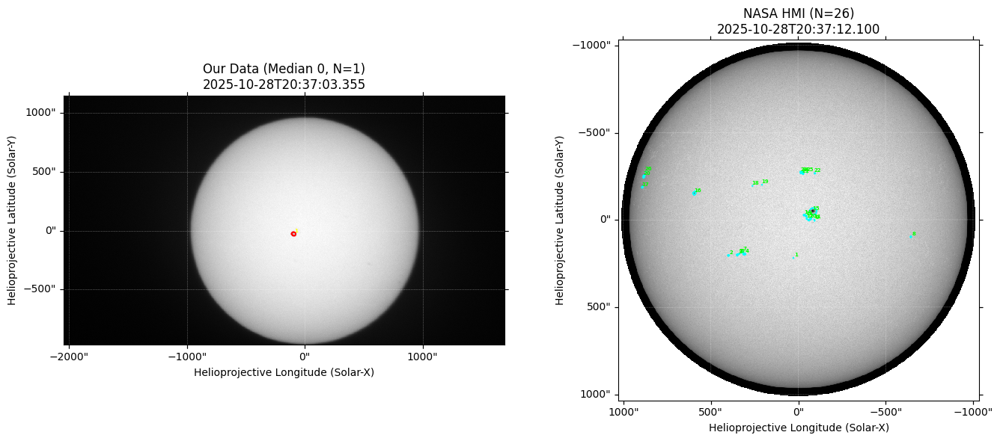

Index 0: our sunspots = 1, HMI sunspots = 26


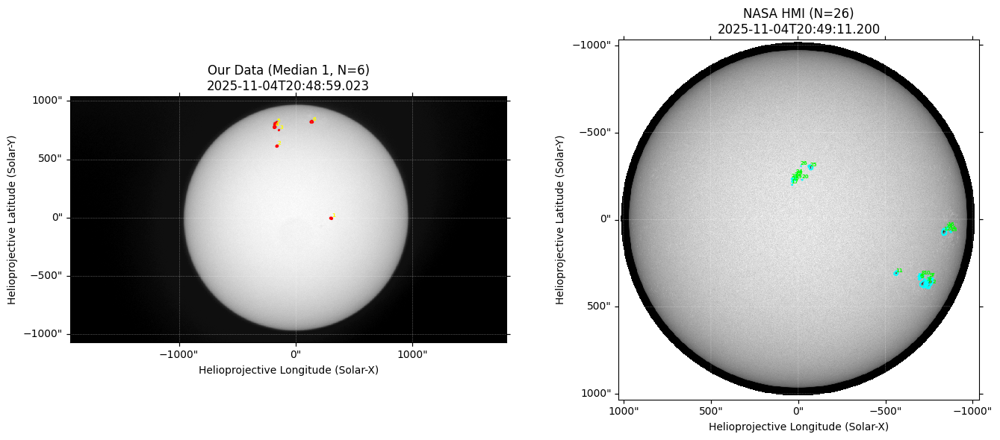

Index 1: our sunspots = 6, HMI sunspots = 26


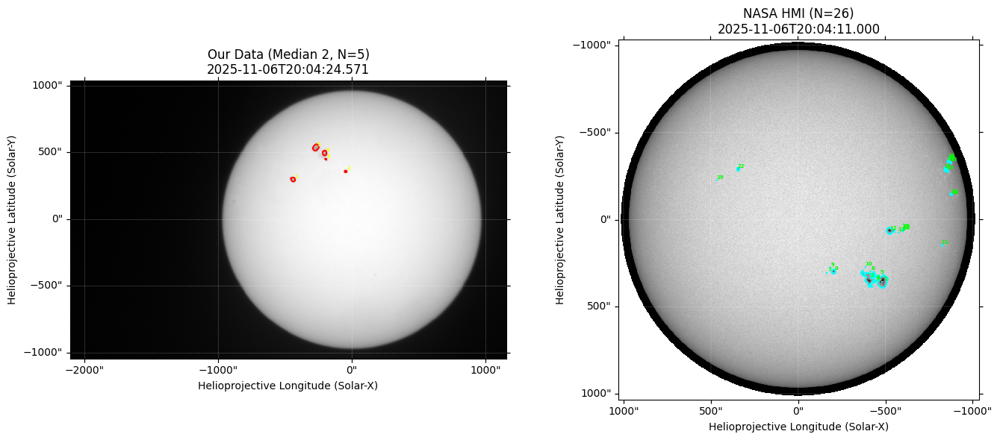

Index 2: our sunspots = 5, HMI sunspots = 26


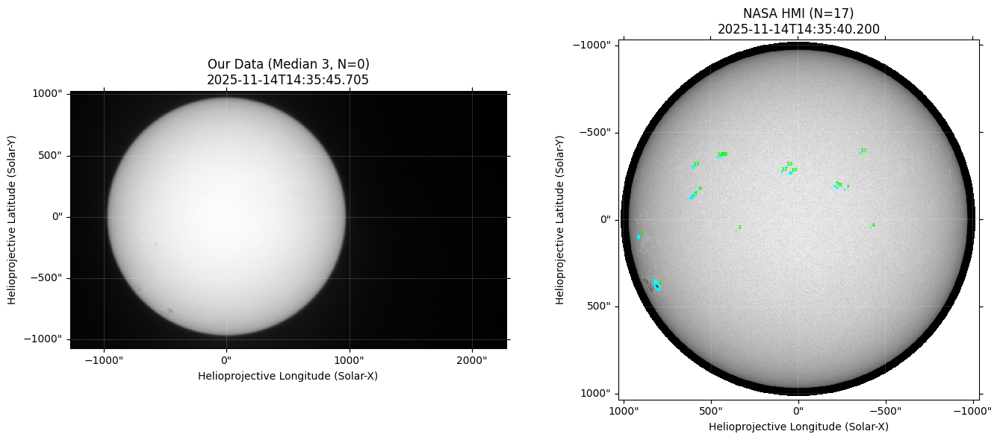

Index 3: our sunspots = 0, HMI sunspots = 17


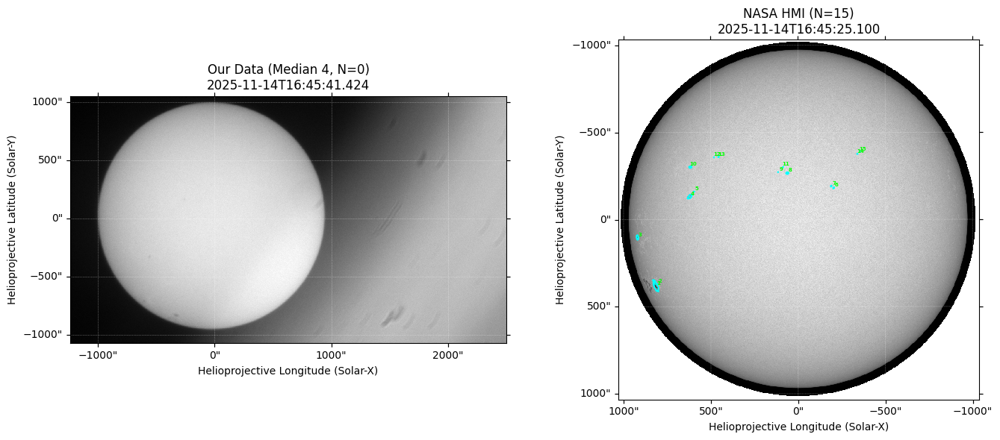

Index 4: our sunspots = 0, HMI sunspots = 15


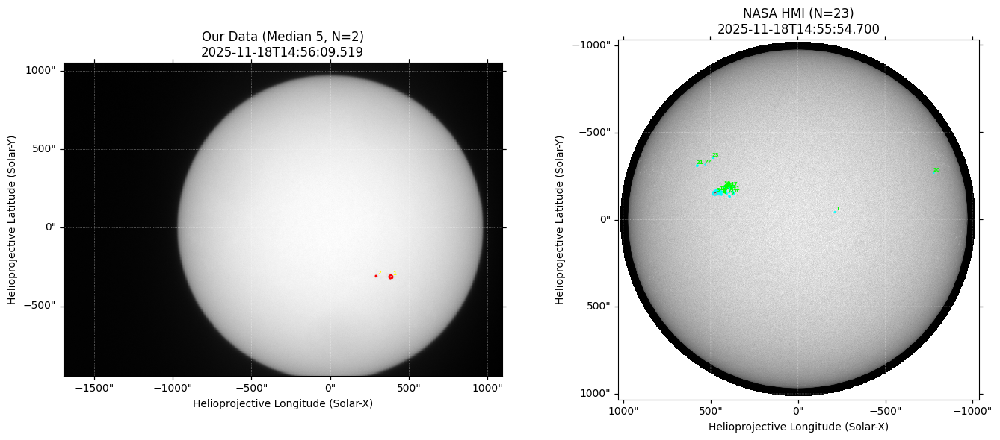

Index 5: our sunspots = 2, HMI sunspots = 23


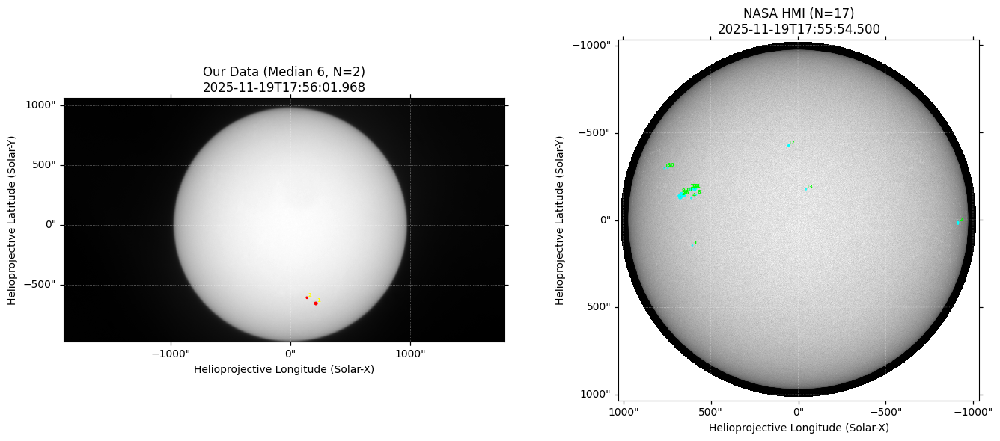

Index 6: our sunspots = 2, HMI sunspots = 17


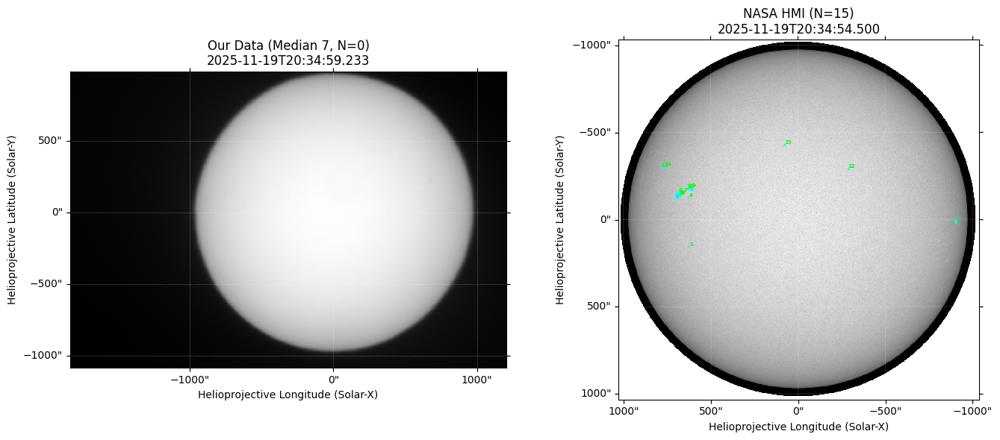

Index 7: our sunspots = 0, HMI sunspots = 15


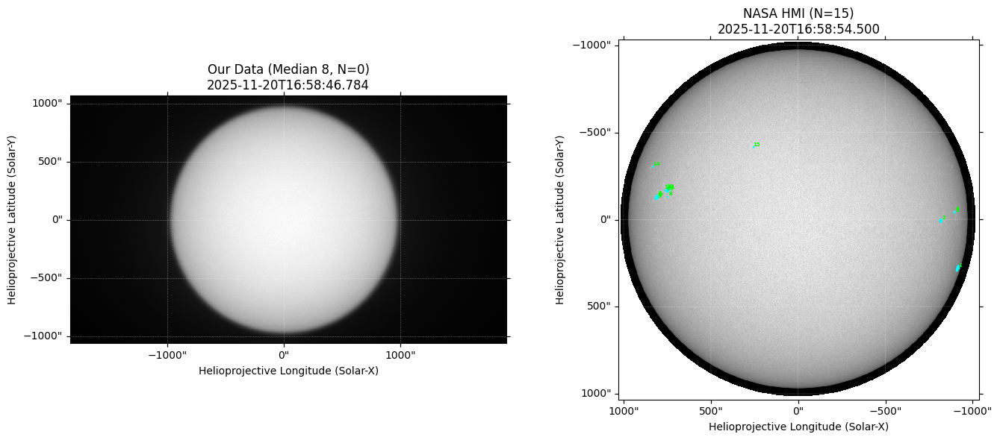

Index 8: our sunspots = 0, HMI sunspots = 15


In [165]:
for i in range(len(median_sequence)):
    plot_stara_side_by_side(
        i,
        median_sequence=median_sequence,
        stara_meds=stara_meds,
        hmi_maps=hmi_small_maps,
        hmi_masks=hmi_masks,
        hmi_pix=hmi_pix,           # if you stored (xs, ys) for HMI
        hmi_labels=hmi_labels,     # if you stored labels for HMI
        med_label_color="yellow",
        hmi_label_color="lime",
        med_offset=(8, 8),
        hmi_offset=(8, 8),
        label_fontsize=5,
    )


In [166]:
#make a table of sunspots for median images

# this doesn't actually need to be a helper function bc i'm only using it once, but i am too tired to fix it and the name says exactly what hte function is doing
# ================================
# 1) AUTO-ONLY TABLE FUNCTION
# ================================

def print_median_sunspot_table_auto(median_sequence, stara_meds):
    """
    For each median image, print a table of AUTO (STARA) sunspots:
      - Sunspot index (label)
      - Pixel coordinates (x, y)
      - HPC coordinates (Solar-X, Solar-Y) in arcsec
    """
    for i, m in enumerate(median_sequence):
        print("\n----------------------------")
        print(f"Median Image {i}  ({m.date.isot})")
        print("----------------------------")

        mask, xs, ys, coords_hpc, labels = stara_meds[i]

        if labels is None or len(labels) == 0:
            print("No sunspots detected.")
            continue

        for lbl, x, y, coord in zip(labels, xs, ys, coords_hpc):
            sx = coord.Tx.to("arcsec").value
            sy = coord.Ty.to("arcsec").value

            print(f"  Auto {lbl}:")
            print(f"      Pixel location:     (x={x:.1f},  y={y:.1f})")
            print(f"      HPC location:       (Solar-X={sx:.1f} arcsec,  Solar-Y={sy:.1f} arcsec)")


In [167]:
#run that

print_median_sunspot_table_auto(median_sequence, stara_meds)



----------------------------
Median Image 0  (2025-10-28T20:37:03.355)
----------------------------
  Auto 1:
      Pixel location:     (x=704.7,  y=339.3)
      HPC location:       (Solar-X=-94.1 arcsec,  Solar-Y=-27.6 arcsec)

----------------------------
Median Image 1  (2025-11-04T20:48:59.023)
----------------------------
  Auto 1:
      Pixel location:     (x=807.3,  y=384.7)
      HPC location:       (Solar-X=304.7 arcsec,  Solar-Y=-7.1 arcsec)
  Auto 2:
      Pixel location:     (x=639.7,  y=608.5)
      HPC location:       (Solar-X=-159.4 arcsec,  Solar-Y=612.7 arcsec)
  Auto 3:
      Pixel location:     (x=645.8,  y=657.8)
      HPC location:       (Solar-X=-142.4 arcsec,  Solar-Y=749.4 arcsec)
  Auto 4:
      Pixel location:     (x=632.3,  y=666.6)
      HPC location:       (Solar-X=-179.8 arcsec,  Solar-Y=773.8 arcsec)
  Auto 5:
      Pixel location:     (x=636.2,  y=678.4)
      HPC location:       (Solar-X=-169.0 arcsec,  Solar-Y=806.4 arcsec)
  Auto 6:
      Pixel locat

In [168]:
# ================================
# 2) MANUAL POINTS + HELPERS
# ================================


# ---- YOUR HAND-WRITTEN PIXELS ----
# Confident manual additions
manual_confident = {
    2: [
        (442.0, 424.5),
        (675, 553)
    ],
    3: [
        (295.1, 110.8),
        (288.3, 98.4),
        (273.4, 107.7),   # corrected value
        (206.9, 174.2),
        (251.6, 305.4),
    ],
    4: [
        (328.5, 86.5),
        (326.5, 74.0),
        (306.0, 78.0),
        (228.0, 131.5),
        (245.0, 266.3),
    ],
}

# Unsure manual additions
manual_unsure = {
    0: [
        (710.8, 258.2),
        (937.1, 246.9),
        (1029.6, 191.6),
    ],
    7: [
        (907.0, 468.0),
    ],
}

# ---- helper: add a manual spot (pixel → HPC) ----
def add_manual_spot_pixel(idx, x_pix, y_pix, median_sequence, manual_dict, label=None):
    """
    Add a manually chosen spot (in pixel coords) for median image idx
    into manual_dict. Computes HPC coords automatically.
    """
    m = median_sequence[idx]
    coord = m.pixel_to_world(x_pix * u.pixel, y_pix * u.pixel)

    if label is None:
        existing = manual_dict.get(idx, [])
        label = f"{len(existing) + 1}"

    spot = {
        "label": label,
        "x": float(x_pix),
        "y": float(y_pix),
        "coord": coord,   # SkyCoord with Tx, Ty in arcsec
    }

    manual_dict.setdefault(idx, []).append(spot)
    return manual_dict

# ---- build TWO separate dicts: confident and unsure ----
manual_spots_confident = {}
for idx, points in manual_confident.items():
    for i, (x, y) in enumerate(points):
        label = f"MC{idx}_{i+1}"      # MC = Manual Confident
        manual_spots_confident = add_manual_spot_pixel(
            idx, x, y, median_sequence, manual_spots_confident, label=label
        )

manual_spots_unsure = {}
for idx, points in manual_unsure.items():
    for i, (x, y) in enumerate(points):
        label = f"MU{idx}_{i+1}"      # MU = Manual Unsure
        manual_spots_unsure = add_manual_spot_pixel(
            idx, x, y, median_sequence, manual_spots_unsure, label=label
        )

# ---- combined dict: confident + unsure ----
manual_spots_all = {}

# start with confident
for idx, spots in manual_spots_confident.items():
    manual_spots_all[idx] = list(spots)   # shallow copy

# add unsure
for idx, spots in manual_spots_unsure.items():
    manual_spots_all.setdefault(idx, []).extend(spots)


In [169]:
# ================================
# 3) AUTO + MANUAL TABLE FUNCTION
# ================================

def print_median_sunspot_table_auto_and_manual(
    median_sequence,
    stara_meds,
    manual_spots=None,
):
    """
    For each median image, print:
      - AUTO (STARA) sunspots
      - MANUAL sunspots (if manual_spots is provided)
    """
    for i, m in enumerate(median_sequence):
        print("\n----------------------------")
        print(f"Median Image {i}  ({m.date.isot})")
        print("----------------------------")

        mask, xs, ys, coords_hpc, labels = stara_meds[i]

        # ---- AUTO spots ----
        if labels is None or len(labels) == 0:
            print("No automatic (STARA) sunspots detected.")
        else:
            for lbl, x, y, coord in zip(labels, xs, ys, coords_hpc):
                sx = coord.Tx.to("arcsec").value
                sy = coord.Ty.to("arcsec").value
                print(f"  Auto {lbl}:")
                print(f"      Pixel location:     (x={x:.1f},  y={y:.1f})")
                print(f"      HPC location:       (Solar-X={sx:.1f} arcsec,  Solar-Y={sy:.1f} arcsec)")

        # ---- MANUAL spots for this median (if given) ----
        if manual_spots is not None and i in manual_spots:
            for spot in manual_spots[i]:
                coord = spot["coord"]
                sx = coord.Tx.to("arcsec").value
                sy = coord.Ty.to("arcsec").value
                print(f"  Manual {spot['label']}:")
                print(f"      Pixel location:     (x={spot['x']:.1f},  y={spot['y']:.1f})")
                print(f"      HPC location:       (Solar-X={sx:.1f} arcsec,  Solar-Y={sy:.1f} arcsec)")


In [170]:
#auto and manual confident

print_median_sunspot_table_auto_and_manual(
    median_sequence,
    stara_meds,
    manual_spots_confident,
)



----------------------------
Median Image 0  (2025-10-28T20:37:03.355)
----------------------------
  Auto 1:
      Pixel location:     (x=704.7,  y=339.3)
      HPC location:       (Solar-X=-94.1 arcsec,  Solar-Y=-27.6 arcsec)

----------------------------
Median Image 1  (2025-11-04T20:48:59.023)
----------------------------
  Auto 1:
      Pixel location:     (x=807.3,  y=384.7)
      HPC location:       (Solar-X=304.7 arcsec,  Solar-Y=-7.1 arcsec)
  Auto 2:
      Pixel location:     (x=639.7,  y=608.5)
      HPC location:       (Solar-X=-159.4 arcsec,  Solar-Y=612.7 arcsec)
  Auto 3:
      Pixel location:     (x=645.8,  y=657.8)
      HPC location:       (Solar-X=-142.4 arcsec,  Solar-Y=749.4 arcsec)
  Auto 4:
      Pixel location:     (x=632.3,  y=666.6)
      HPC location:       (Solar-X=-179.8 arcsec,  Solar-Y=773.8 arcsec)
  Auto 5:
      Pixel location:     (x=636.2,  y=678.4)
      HPC location:       (Solar-X=-169.0 arcsec,  Solar-Y=806.4 arcsec)
  Auto 6:
      Pixel locat

In [171]:
#auto, manual confident, and manual unsure

print_median_sunspot_table_auto_and_manual(
    median_sequence,
    stara_meds,
    manual_spots_all,
)


----------------------------
Median Image 0  (2025-10-28T20:37:03.355)
----------------------------
  Auto 1:
      Pixel location:     (x=704.7,  y=339.3)
      HPC location:       (Solar-X=-94.1 arcsec,  Solar-Y=-27.6 arcsec)
  Manual MU0_1:
      Pixel location:     (x=710.8,  y=258.2)
      HPC location:       (Solar-X=-77.1 arcsec,  Solar-Y=-252.1 arcsec)
  Manual MU0_2:
      Pixel location:     (x=937.1,  y=246.9)
      HPC location:       (Solar-X=549.6 arcsec,  Solar-Y=-283.3 arcsec)
  Manual MU0_3:
      Pixel location:     (x=1029.6,  y=191.6)
      HPC location:       (Solar-X=805.7 arcsec,  Solar-Y=-436.5 arcsec)

----------------------------
Median Image 1  (2025-11-04T20:48:59.023)
----------------------------
  Auto 1:
      Pixel location:     (x=807.3,  y=384.7)
      HPC location:       (Solar-X=304.7 arcsec,  Solar-Y=-7.1 arcsec)
  Auto 2:
      Pixel location:     (x=639.7,  y=608.5)
      HPC location:       (Solar-X=-159.4 arcsec,  Solar-Y=612.7 arcsec)
  Auto 3

In [172]:
#now plot these again with index names

# so i can print out paper copies and manually match them

# ---------------------------------------------------------
# spot_table must contain (frame, name, x, y)
# EXAMPLE FORMAT (Pandas DataFrame)
# frame | name | x_pix | y_pix
#   0   |  A1  | 705.2 | 339.0
#   0   |  M1  | 710.5 | 342.1
#   1   |  A1  | 807.3 | 384.7
# ---------------------------------------------------------

def plot_median_with_labels(aligned_med_seq, spot_table):
    """
    aligned_med_seq : MapSequence of median maps
    spot_table      : DataFrame or list of dicts containing the sunspot coordinates
    """

    for i, map_i in enumerate(aligned_med_seq):

        fig = plt.figure(figsize=(6,6))
        ax = plt.subplot(projection=map_i)

        # 1) Plot the median map itself
        map_i.plot(axes=ax)

        # 2) Extract the spots belonging to this frame index
        if hasattr(spot_table, "loc"):
            # Pandas version
            rows = spot_table.loc[spot_table["frame"] == i]
        else:
            # List-of-dicts version
            rows = [r for r in spot_table if r["frame"] == i]

        # 3) Overlay each sunspot
        for _, row in (rows.iterrows() if hasattr(spot_table,"iterrows") else enumerate(rows)):
            x = row["x_pix"]
            y = row["y_pix"]
            name = row["name"]

            # scatter point
            ax.plot(x, y, "o", color="red", markersize=6)

            # label
            ax.text(
                x + 5, y + 5,       # slight offset so text isn't on top of spot
                name,
                color="yellow",
                fontsize=10,
                weight="bold"
            )

        ax.set_title(f"Median Image {i} — Sunspot Labels")
        plt.show()


no label means auto, MC is manual confident, MU is manual unsure

In [173]:
# i had chat gpt manually make my printed table into something plottable. not the best in terms of reproducability but needed to get this project done (time wise)

spot_rows = [
    # ---------- Median Image 0 ----------
    dict(frame=0, name="A0_1",  kind="auto",
         x_pix=704.7, y_pix=339.1,
         solar_x_arcsec=-94.1,  solar_y_arcsec=-28.2),
    dict(frame=0, name="MU0_1", kind="manual",
         x_pix=710.8, y_pix=258.2,
         solar_x_arcsec=-77.1,  solar_y_arcsec=-252.1),
    dict(frame=0, name="MU0_2", kind="manual",
         x_pix=937.1, y_pix=246.9,
         solar_x_arcsec=549.6,  solar_y_arcsec=-283.3),
    dict(frame=0, name="MU0_3", kind="manual",
         x_pix=1029.6, y_pix=191.6,
         solar_x_arcsec=805.7,  solar_y_arcsec=-436.5),

    # ---------- Median Image 1 ----------
    dict(frame=1, name="A1_1", kind="auto",
         x_pix=807.3, y_pix=384.7,
         solar_x_arcsec=304.7,  solar_y_arcsec=-7.1),
    dict(frame=1, name="A1_2", kind="auto",
         x_pix=639.7, y_pix=608.5,
         solar_x_arcsec=-159.4, solar_y_arcsec=612.7),
    dict(frame=1, name="A1_3", kind="auto",
         x_pix=645.8, y_pix=657.8,
         solar_x_arcsec=-142.4, solar_y_arcsec=749.4),
    dict(frame=1, name="A1_4", kind="auto",
         x_pix=632.3, y_pix=666.6,
         solar_x_arcsec=-179.8, solar_y_arcsec=773.8),
    dict(frame=1, name="A1_5", kind="auto",
         x_pix=636.2, y_pix=678.4,
         solar_x_arcsec=-169.0, solar_y_arcsec=806.4),
    dict(frame=1, name="A1_6", kind="auto",
         x_pix=747.1, y_pix=683.6,
         solar_x_arcsec=138.0,  solar_y_arcsec=820.8),

    # ---------- Median Image 2 ----------
    dict(frame=2, name="A2_1", kind="auto",
         x_pix=823.5, y_pix=227.0,
         solar_x_arcsec=174.0,  solar_y_arcsec=-415.4),
    dict(frame=2, name="A2_2", kind="auto",
         x_pix=601.8, y_pix=484.6,
         solar_x_arcsec=-439.9, solar_y_arcsec=298.0),
    dict(frame=2, name="A2_3", kind="auto",
         x_pix=744.5, y_pix=506.0,
         solar_x_arcsec=-44.8,  solar_y_arcsec=357.1),
    dict(frame=2, name="A2_4", kind="auto",
         x_pix=686.5, y_pix=550.5,
         solar_x_arcsec=-205.3, solar_y_arcsec=480.5),
    dict(frame=2, name="A2_5", kind="auto",
         x_pix=663.8, y_pix=571.0,
         solar_x_arcsec=-268.3, solar_y_arcsec=537.2),
    dict(frame=2, name="MC2_1", kind="manual",
         x_pix=442.0, y_pix=424.5,
         solar_x_arcsec=-882.5, solar_y_arcsec=131.5),
    dict(frame=2, name="MC2_2", kind="manual",
         x_pix=675.0, y_pix=553.0,
         solar_x_arcsec=-237.3, solar_y_arcsec=487.4),

    # ---------- Median Image 3 ----------
    dict(frame=3, name="MC3_1", kind="manual",
         x_pix=295.1, y_pix=110.8,
         solar_x_arcsec=-455.2, solar_y_arcsec=-764.3),
    dict(frame=3, name="MC3_2", kind="manual",
         x_pix=288.3, y_pix=98.4,
         solar_x_arcsec=-474.0, solar_y_arcsec=-798.6),
    dict(frame=3, name="MC3_3", kind="manual",
         x_pix=273.4, y_pix=107.7,
         solar_x_arcsec=-515.2, solar_y_arcsec=-772.9),
    dict(frame=3, name="MC3_4", kind="manual",
         x_pix=206.9, y_pix=174.2,
         solar_x_arcsec=-699.4, solar_y_arcsec=-588.7),
    dict(frame=3, name="MC3_5", kind="manual",
         x_pix=251.6, y_pix=305.4,
         solar_x_arcsec=-575.6, solar_y_arcsec=-225.4),

    # ---------- Median Image 4 ----------
    dict(frame=4, name="MC4_1", kind="manual",
         x_pix=328.5, y_pix=86.5,
         solar_x_arcsec=-327.2, solar_y_arcsec=-827.7),
    dict(frame=4, name="MC4_2", kind="manual",
         x_pix=326.5, y_pix=74.0,
         solar_x_arcsec=-332.7, solar_y_arcsec=-862.3),
    dict(frame=4, name="MC4_3", kind="manual",
         x_pix=306.0, y_pix=78.0,
         solar_x_arcsec=-389.5, solar_y_arcsec=-851.3),
    dict(frame=4, name="MC4_4", kind="manual",
         x_pix=228.0, y_pix=131.5,
         solar_x_arcsec=-605.5, solar_y_arcsec=-703.1),
    dict(frame=4, name="MC4_5", kind="manual",
         x_pix=245.0, y_pix=266.3,
         solar_x_arcsec=-558.4, solar_y_arcsec=-329.8),

    # ---------- Median Image 5 ----------
    dict(frame=5, name="A5_1", kind="auto",
         x_pix=750.5, y_pix=227.6,
         solar_x_arcsec=385.4,  solar_y_arcsec=-313.5),
    dict(frame=5, name="A5_2", kind="auto",
         x_pix=716.7, y_pix=229.2,
         solar_x_arcsec=291.7,  solar_y_arcsec=-309.1),

    # ---------- Median Image 6 ----------
    dict(frame=6, name="A6_1", kind="auto",
         x_pix=758.7, y_pix=115.4,
         solar_x_arcsec=211.0,  solar_y_arcsec=-653.2),
    dict(frame=6, name="A6_2", kind="auto",
         x_pix=731.8, y_pix=132.6,
         solar_x_arcsec=136.4,  solar_y_arcsec=-605.6),

    # ---------- Median Image 7 ----------
    dict(frame=7, name="MU7_1", kind="manual",
         x_pix=907.0, y_pix=468.0,
         solar_x_arcsec=677.3,  solar_y_arcsec=213.3),
]

spot_table = pd.DataFrame(spot_rows)
spot_table



,frame,name,kind,x_pix,y_pix,solar_x_arcsec,solar_y_arcsec
0,0,A0_1,auto,704.7,339.1,-94.1,-28.2
1,0,MU0_1,manual,710.8,258.2,-77.1,-252.1
2,0,MU0_2,manual,937.1,246.9,549.6,-283.3
3,0,MU0_3,manual,1029.6,191.6,805.7,-436.5
4,1,A1_1,auto,807.3,384.7,304.7,-7.1
5,1,A1_2,auto,639.7,608.5,-159.4,612.7
6,1,A1_3,auto,645.8,657.8,-142.4,749.4
7,1,A1_4,auto,632.3,666.6,-179.8,773.8
8,1,A1_5,auto,636.2,678.4,-169.0,806.4
9,1,A1_6,auto,747.1,683.6,138.0,820.8


For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:16:00 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



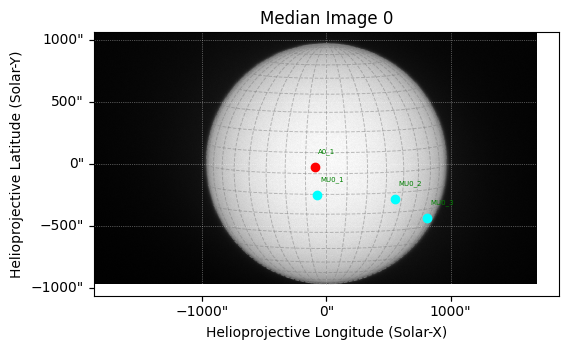

For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:16:00 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



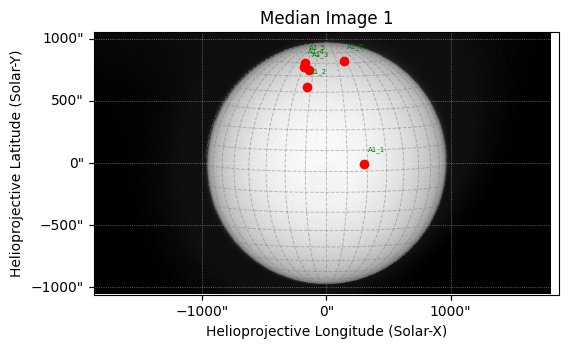

For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:16:01 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



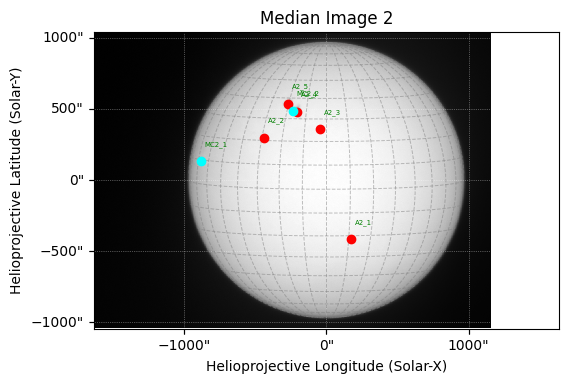

For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:16:01 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



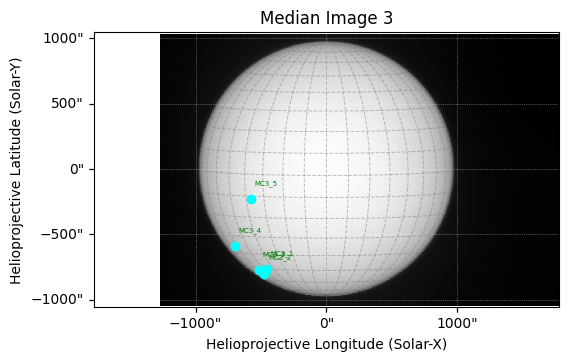

For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:16:02 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



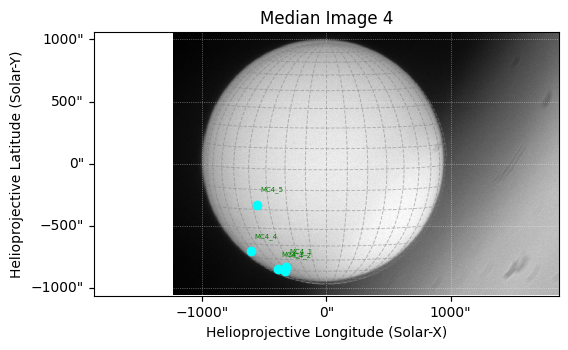

For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:16:02 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



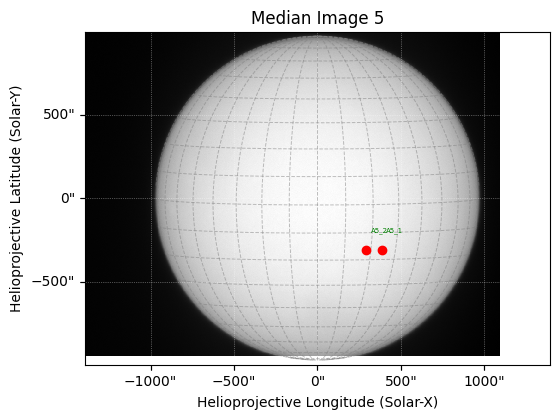

For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:16:02 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



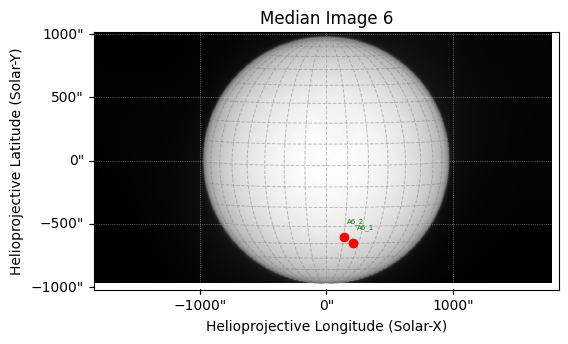

For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:16:03 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



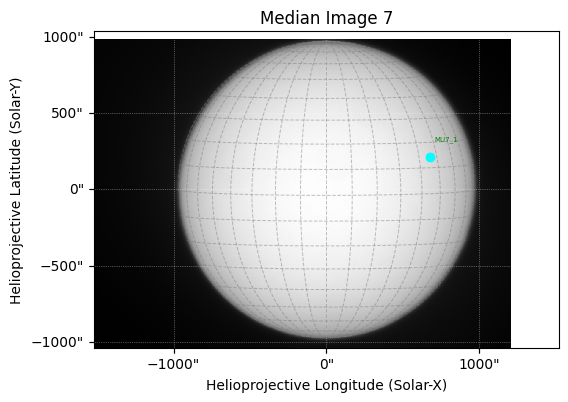

For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs
 [sunpy.map.mapbase]
2025-12-10 10:16:03 - sunpy - WARNING: SunpyMetadataWarning: Missing metadata for observer: assuming Earth-based observer.
For frame 'heliographic_stonyhurst' the following metadata is missing: hglt_obs,hgln_obs
For frame 'heliographic_carrington' the following metadata is missing: crlt_obs,crln_obs



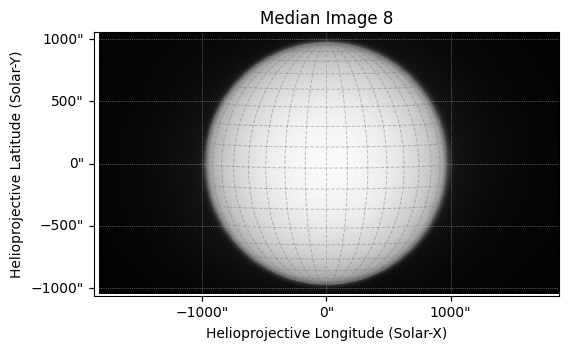

In [ ]:
from astropy.coordinates import SkyCoord

def plot_median_with_labels(median_sequence, spot_table):
    for i, med in enumerate(median_sequence):
        rot = med.rotate(order=3, recenter=True)

        fig = plt.figure(figsize=(6, 6))
        ax = plt.subplot(projection=rot)

        rot.plot(axes=ax)
        rot.draw_grid(
            axes=ax,
            grid_spacing=10*u.deg,
            grid_type="lines",
            alpha=0.5,
            color="gray",
            linestyle="--",
            linewidth=0.7,
            annotate=True,
        )

        rows = spot_table[spot_table["frame"] == i]

        for _, row in rows.iterrows():
            hpc_frame = frames.Helioprojective(
                observer=rot.observer_coordinate or "earth",
                obstime=rot.date,
            )
            coord = SkyCoord(
                Tx=row["solar_x_arcsec"] * u.arcsec,
                Ty=row["solar_y_arcsec"] * u.arcsec,
                frame=hpc_frame,
            )
            px, py = rot.world_to_pixel(coord)

            color = "red" if row["kind"] == "auto" else "cyan"
            ax.plot(px.value, py.value, "o", color=color, markersize=6)
            ax.text(px.value + 10, py.value + 40, row["name"], color="green", fontsize=5)

        ax.set_title(f"Median Image {i}")
        filepath = os.path.join(outdir, f"median_{i}_lines_with_spots.png")
        plt.savefig(filepath, dpi=200, bbox_inches="tight")
        plt.show()
# call it:
plot_median_with_labels(median_sequence, spot_table)


Saved: sunspot_plots final project/median_0_with_spots.png


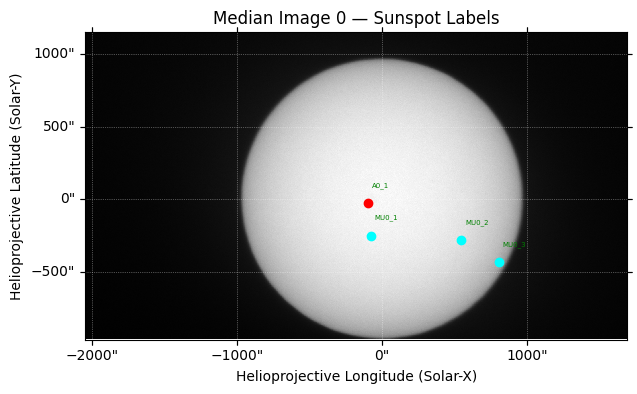

Saved: sunspot_plots final project/median_1_with_spots.png


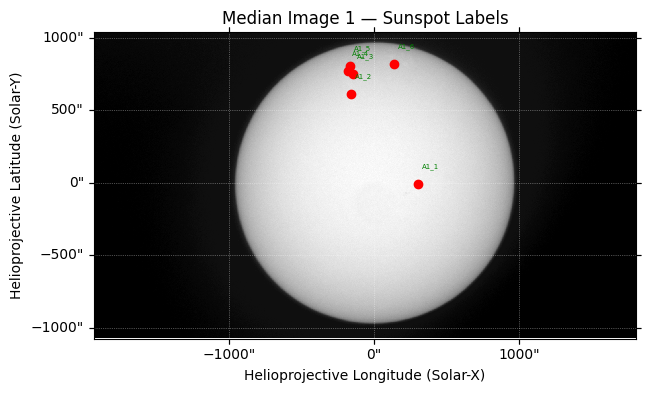

Saved: sunspot_plots final project/median_2_with_spots.png


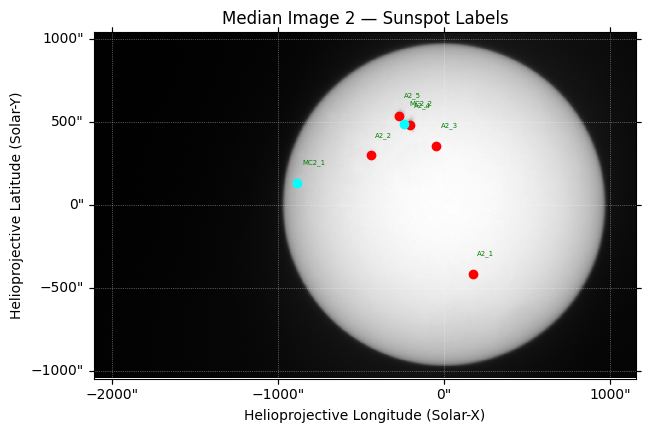

Saved: sunspot_plots final project/median_3_with_spots.png


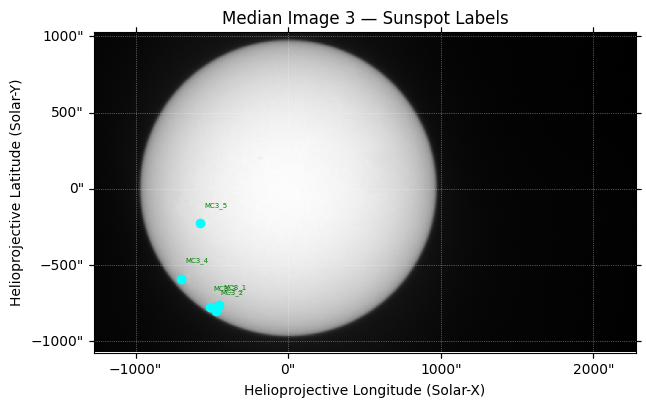

Saved: sunspot_plots final project/median_4_with_spots.png


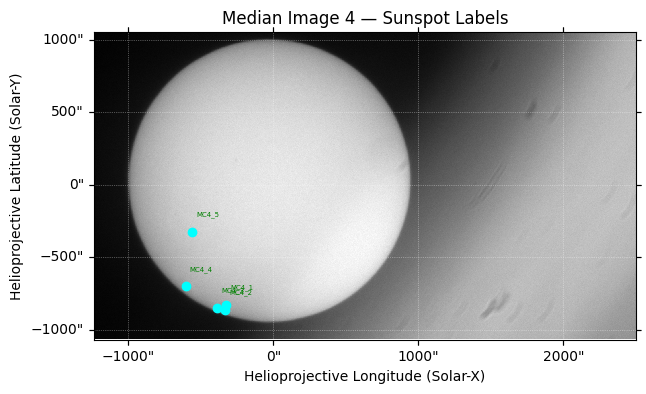

Saved: sunspot_plots final project/median_5_with_spots.png


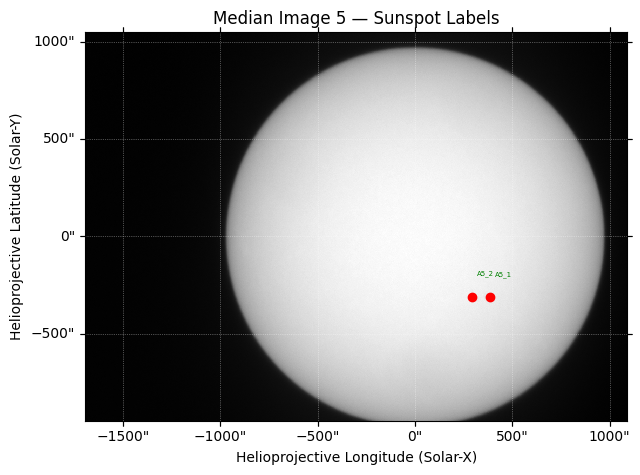

Saved: sunspot_plots final project/median_6_with_spots.png


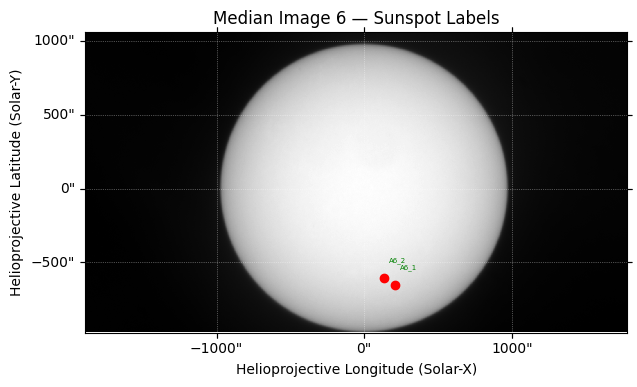

Saved: sunspot_plots final project/median_7_with_spots.png


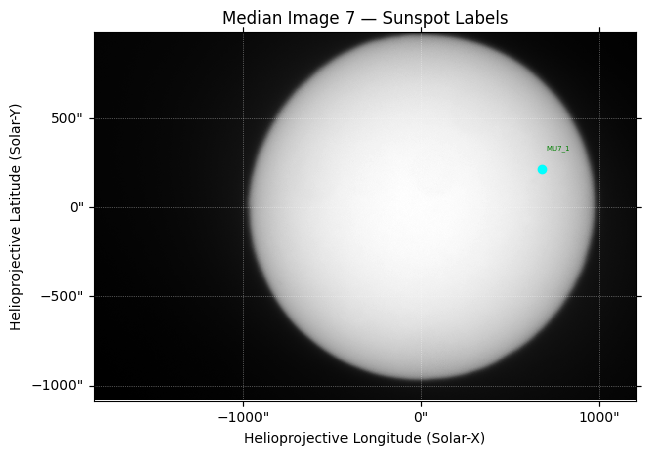

Saved: sunspot_plots final project/median_8_with_spots.png


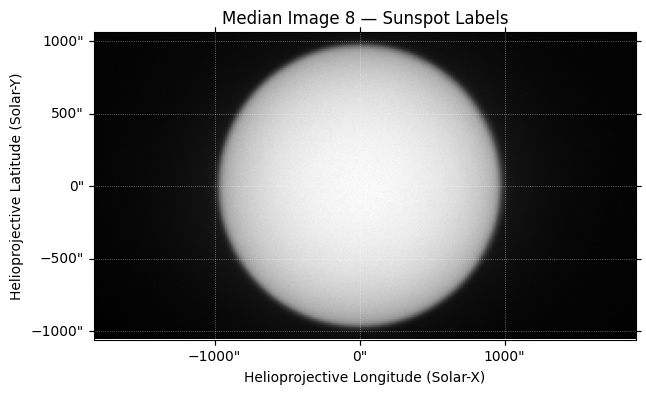

In [175]:
def plot_median_with_labels_and_save(median_sequence, spot_table, outdir="sunspot_plots final project"):
    """
    Plots each median image with labeled sunspots and saves PNGs.

    Parameters
    ----------
    median_sequence : MapSequence
    spot_table : DataFrame containing frame, x_pix, y_pix, name, kind
    outdir : folder to save PNGs
    """
    # create output directory if it does not exist
    os.makedirs(outdir, exist_ok=True)

    for i, med in enumerate(median_sequence):
        fig = plt.figure(figsize=(7, 7))
        ax = plt.subplot(projection=med)

        # 1. show the image
        med.plot(axes=ax)

        # 2. fetch all rows for this frame
        rows = spot_table[spot_table["frame"] == i]

        # 3. overlay sunspot markers + labels
        for _, row in rows.iterrows():
            x = row["x_pix"]
            y = row["y_pix"]
            name = row["name"]
            kind = row["kind"]

            # colors
            color = "red" if kind == "auto" else "cyan"

            # marker
            ax.plot(x, y, "o", color=color, markersize=6)

            # label (your updated formatting)
            ax.text(
                x + 10, y + 40,
                name,
                color="green",
                fontsize=5,
            )

        ax.set_title(f"Median Image {i} — Sunspot Labels")

        # save PNG
        filepath = os.path.join(outdir, f"median_{i}_with_spots.png")
        plt.savefig(filepath, dpi=200, bbox_inches="tight")
        print(f"Saved: {filepath}")

        plt.show()
        plt.close(fig)

plot_median_with_labels_and_save(median_sequence, spot_table, outdir="sunspot_plots final project")


Note on AI Usage: AI is allowed for this proejct, and I take all responsibility for any errors. I make sure that if I am using AI, I understand what the code is doing (I have written the pseudocode already), but am using AI to save time in writing the functions themselves. As the code progresses, I use AI more to save time to have some result by the time of the presentation. It is also useful for debugging and helping me understand complicated and confusing package documentation.

In [176]:
#CHECK TIMES

for i, m in enumerate(median_sequence):
    print(i, m.date.isot, m.date.scale)

#create median_time_offsets
if len(median_sequence) == 0:
    median_time_offsets = []
else:
    t0 = median_sequence[0].date
    median_time_offsets = [
        int(np.rint((m.date - t0).to_value(u.min)))
        for m in median_sequence
    ]

print("Median time offsets (s):", median_time_offsets)

#compare to imaging log google sheet

#this is correct est to utc conversion yay


0 2025-10-28T20:37:03.355 utc
1 2025-11-04T20:48:59.023 utc
2 2025-11-06T20:04:24.571 utc
3 2025-11-14T14:35:45.705 utc
4 2025-11-14T16:45:41.424 utc
5 2025-11-18T14:56:09.519 utc
6 2025-11-19T17:56:01.968 utc
7 2025-11-19T20:34:59.233 utc
8 2025-11-20T16:58:46.784 utc
Median time offsets (s): [0, 10092, 12927, 24119, 24249, 29899, 31519, 31678, 32902]


In [177]:
#7: convert coordinates

#first x-y to hpc


#then hpc to heliographic

In [178]:
#8: index sunspots


#first convert to heliographic (sun long and lat) coordinates





#we are going to match these manually

#then print out the locations of each sunspot to add to a new table that tracks the same sunspot over time


